#Covid 19 Detector

This model is not suitable for productio as very less data is available .
The model can only be fully validated when the data is sufficient.


TECHNOLOGY USED:
1:CONVOLUTIONAL NEURAL NETWORK

The data gives very good recall score of 1 on positive data as recall score should be high for medical purpose.

##DATA

# 142 images for normal class.
# 142 images for covid class.

In [0]:
!wget http://cb.lk/covid_19

--2020-06-11 10:11:06--  http://cb.lk/covid_19
Resolving cb.lk (cb.lk)... 159.89.170.74
Connecting to cb.lk (cb.lk)|159.89.170.74|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://cb.lk/covid_19 [following]
--2020-06-11 10:11:08--  https://cb.lk/covid_19
Connecting to cb.lk (cb.lk)|159.89.170.74|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/s/7rjw6oet4za01op/CovidDataset-20200427T133042Z-001.zip?dl=0 [following]
--2020-06-11 10:11:08--  https://www.dropbox.com/s/7rjw6oet4za01op/CovidDataset-20200427T133042Z-001.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.1, 2620:100:6032:1::a27d:5201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/7rjw6oet4za01op/CovidDataset-20200427T133042Z-001.zip [following]
--2020-06-11 10:11:08--  https://www.dropbox.com/s/raw/7

In [0]:
!unzip covid_19

Archive:  covid_19
  inflating: CovidDataset/Val/Covid/88de9d8c39e946abd495b37cd07d89e5-6531-0.jpg  
  inflating: CovidDataset/Val/Covid/covid-19-pneumonia-8.jpg  
  inflating: CovidDataset/Val/Covid/85E52EB3-56E9-4D67-82DA-DEA247C82886.jpeg  
  inflating: CovidDataset/Val/Covid/4-x-day1.jpg  
  inflating: CovidDataset/Val/Covid/covid-19-pneumonia-53.jpg  
  inflating: CovidDataset/Val/Covid/4e43e48d52c9e2d4c6c1fb9bc1544f_jumbo.jpeg  
  inflating: CovidDataset/Val/Covid/covid-19-pneumonia-35-1.jpg  
  inflating: CovidDataset/Val/Covid/53EC07C9-5CC6-4BE4-9B6F-D7B0D72AAA7E.jpeg  
  inflating: CovidDataset/Val/Covid/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg  
  inflating: CovidDataset/Val/Covid/58cb9263f16e94305c730685358e4e_jumbo.jpeg  
  inflating: CovidDataset/Val/Covid/6b3bdbc31f65230b8cdcc3cef5f8ba8a-40ac-0.jpg  
  inflating: CovidDataset/Val/Covid/auntminnie-d-2020_01_28_23_51_6665_2020_01_28_Vietnam_coronavirus.jpeg  
  inflating: CovidDataset/Val/Covid/6b44464d-73a7-4cf3-bbb6-ffe7

In [0]:
TRAIN_PATH="/content/CovidDataset/Train"
VAL_PATH="/content/CovidDataset/Val"

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import *
from keras.layers import *
from keras.preprocessing import image

Using TensorFlow backend.


#Model

Tranfer learning with imagenet features does not perform well as X-ray data is very different from imagenet data.

In [0]:
#CNN MODEL IN KERAS
model=Sequential()
model.add(Conv2D(32,kernel_size=(3,3),activation="relu",input_shape=(224,224,3)))
model.add(Conv2D(64,(3,3),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(.25))

model.add(Conv2D(64,(3,3),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(.25))

model.add(Conv2D(128,(3,3),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(.25))
model.add(Flatten())
model.add(Dense(64,activation="relu"))
model.add(Dropout(.5))
model.add(Dense(1,activation=("sigmoid")))
model.compile(loss=keras.losses.binary_crossentropy,optimizer="adam",metrics=["accuracy"])






In [0]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 220, 220, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 110, 110, 64)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 110, 110, 64)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 108, 108, 64)      36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 54, 54, 64)       

#DATA GENERATION AND AUGMENTATION

##TRAIN

In [0]:
#TRAIN
train_datage=image.ImageDataGenerator(
   rescale=1./255,
   shear_range=.2,
   zoom_range=.2,
   horizontal_flip=True,
   )
test_dataset=image.ImageDataGenerator(rescale=1./255)

In [0]:
train_generator=train_datage.flow_from_directory(
    "CovidDataset/Train",
    target_size=(224,224),
    batch_size=32,
    class_mode="binary"
)


Found 224 images belonging to 2 classes.


In [0]:
train_generator.class_indices

{'Covid': 0, 'Normal': 1}

##VALIDATION DATA

In [0]:
validation_generator=test_dataset.flow_from_directory(
    "CovidDataset/Val",
    target_size=(224,224),
    batch_size=32,
    class_mode="binary"
)


Found 60 images belonging to 2 classes.


#EVALUATION

In [0]:
history1=model.fit_generator(
    train_generator,
    steps_per_epoch=8,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=2
)

Epoch 1/10
8/8 [==============================] - 10s 1s/step - loss: 0.1272 - accuracy: 0.9570 - val_loss: 0.0887 - val_accuracy: 0.9667
Epoch 2/10
8/8 [==============================] - 9s 1s/step - loss: 0.1074 - accuracy: 0.9688 - val_loss: 0.0586 - val_accuracy: 0.9667
Epoch 3/10
8/8 [==============================] - 9s 1s/step - loss: 0.0956 - accuracy: 0.9570 - val_loss: 0.0432 - val_accuracy: 0.9667
Epoch 4/10
8/8 [==============================] - 9s 1s/step - loss: 0.0688 - accuracy: 0.9727 - val_loss: 0.0110 - val_accuracy: 0.9667
Epoch 5/10
8/8 [==============================] - 9s 1s/step - loss: 0.0788 - accuracy: 0.9727 - val_loss: 0.0787 - val_accuracy: 0.9667
Epoch 6/10
8/8 [==============================] - 9s 1s/step - loss: 0.0565 - accuracy: 0.9844 - val_loss: 0.0118 - val_accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 9s 1s/step - loss: 0.1041 - accuracy: 0.9648 - val_loss: 0.0463 - val_accuracy: 0.9667
Epoch 8/10
8/8 [========================

In [0]:
model.save("model_adv.h5")

In [0]:
model.evaluate_generator(train_generator)

[0.06671765446662903, 0.9776785969734192]

In [0]:
model.evaluate_generator(validation_generator)

[0.012407427653670311, 0.9666666388511658]

In [0]:
model=load_model("model_adv.h5")

In [0]:
import os

In [0]:
train_generator.class_indices

{'Covid': 0, 'Normal': 1}

In [0]:
y_actual=[]
y_test=[]

In [0]:
for i in os.listdir('/content/CovidDataset/Val/Normal/'):
  img=image.load_img('/content/CovidDataset/Val/Normal/'+i,target_size=(224,224))
  img=image.img_to_array(img)
  img=np.expand_dims(img,axis=0)
  p=model.predict_classes(img)
  y_test.append(p[0,0])
  y_actual.append(1)


In [0]:
for i in os.listdir('/content/CovidDataset/Val/Covid/'):
  img=image.load_img('/content/CovidDataset/Val/Covid/'+i,target_size=(224,224))
  img=image.img_to_array(img)
  img=np.expand_dims(img,axis=0)
  p=model.predict_classes(img)
  y_test.append(p[0,0])
  y_actual.append(0)


In [0]:
y_actual=np.array(y_actual)
y_test=np.array(y_test)

#Confusion Matrix

##0=COVID POSITIVE
##1=COVID NEGETIVE

In [0]:
from sklearn.metrics import confusion_matrix

In [0]:
import seaborn as sns

In [0]:
cm=confusion_matrix(y_actual,y_test)

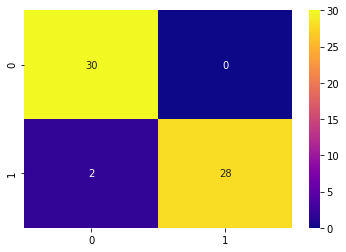

In [0]:
sns.heatmap(cm,cmap="plasma",annot=True)

#Classification Report

In [0]:
from sklearn.metrics import classification_report
labels = ['Covid', 'Not covid']
print(classification_report(y_actual, y_test, target_names=labels))

              precision    recall  f1-score   support

       Covid       0.94      1.00      0.97        30
   Not covid       1.00      0.93      0.97        30

    accuracy                           0.97        60
   macro avg       0.97      0.97      0.97        60
weighted avg       0.97      0.97      0.97        60



In [0]:
print(history1.history.keys())

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


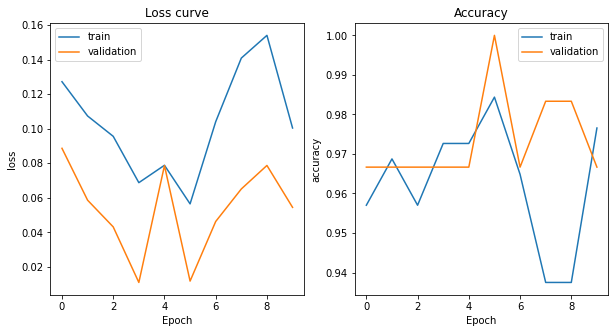

In [0]:

# get the training and validation accuracy from the history object
train_acc = history1.history['accuracy']
valid_acc = history1.history['val_accuracy']

# get the loss
train_loss = history1.history['loss']
valid_loss = history1.history['val_loss']

# get the number of entries
xvalues = np.arange(len(train_acc))

# visualize
f,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(xvalues, train_loss)
ax[0].plot(xvalues, valid_loss)
ax[0].set_title("Loss curve")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("loss")
ax[0].legend(['train', 'validation'])

ax[1].plot(xvalues, train_acc)
ax[1].plot(xvalues, valid_acc)
ax[1].set_title("Accuracy")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("accuracy")
ax[1].legend(['train', 'validation'])

plt.show()

#VISUALIZATION OF OUTPUT OF VARIOUS LAYERS

In [0]:
! pip install keract

In [0]:

def preprocess_image(img_path, model=None, rescale=255, resize=(224, 224)):
    """
    Preprocesses a given image for prediction with a trained model, with rescaling and resizing options
    
    Arguments:
            img_path: The path to the image file
            rescale: A float or integer indicating required rescaling. 
                    The image array will be divided (scaled) by this number.
            resize: A tuple indicating desired target size. 
                    This should match the input shape as expected by the model
    Returns:
            img: A processed image.
    """
    from keras.preprocessing.image import img_to_array, load_img
    import cv2
    import numpy as np

    assert type(img_path) == str, "Image path must be a string"
    assert (
        type(rescale) == int or type(rescale) == float
    ), "Rescale factor must be either a float or int"
    assert (
        type(resize) == tuple and len(resize) == 2
    ), "Resize target must be a tuple with two elements"

    img = load_img(img_path)
    img = img_to_array(img)
    img = img / float(rescale)
    img = cv2.resize(img, resize)
    if model != None:
        if len(model.input_shape) == 4:
            img = np.expand_dims(img, axis=0)

    return img

### VISUALIZATION FOR COVID POSITIVE CASE

In [0]:
img_path = '/content/CovidDataset/Train/Covid/16660_1_1.jpg'

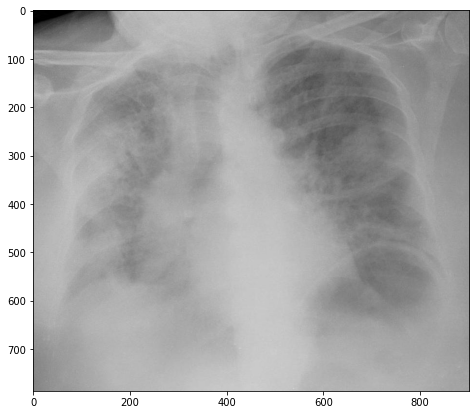

In [0]:
import matplotlib.pyplot as plt
import PIL
plt.figure(figsize=(8,7))
plt.imshow(PIL.Image.open(img_path))
plt.show()

In [0]:
x = preprocess_image(img_path=img_path,model=model,resize=(224,224))

In [0]:
model.predict_classes(x)

array([[0]], dtype=int32)

In [0]:
from keract import get_activations
activations = get_activations(model, x)

In [0]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 220, 220, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 110, 110, 64)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 110, 110, 64)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 108, 108, 64)      36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 54, 54, 64)       

### Display activations after various layers

conv2d_1_input_2 (1, 224, 224, 3) 


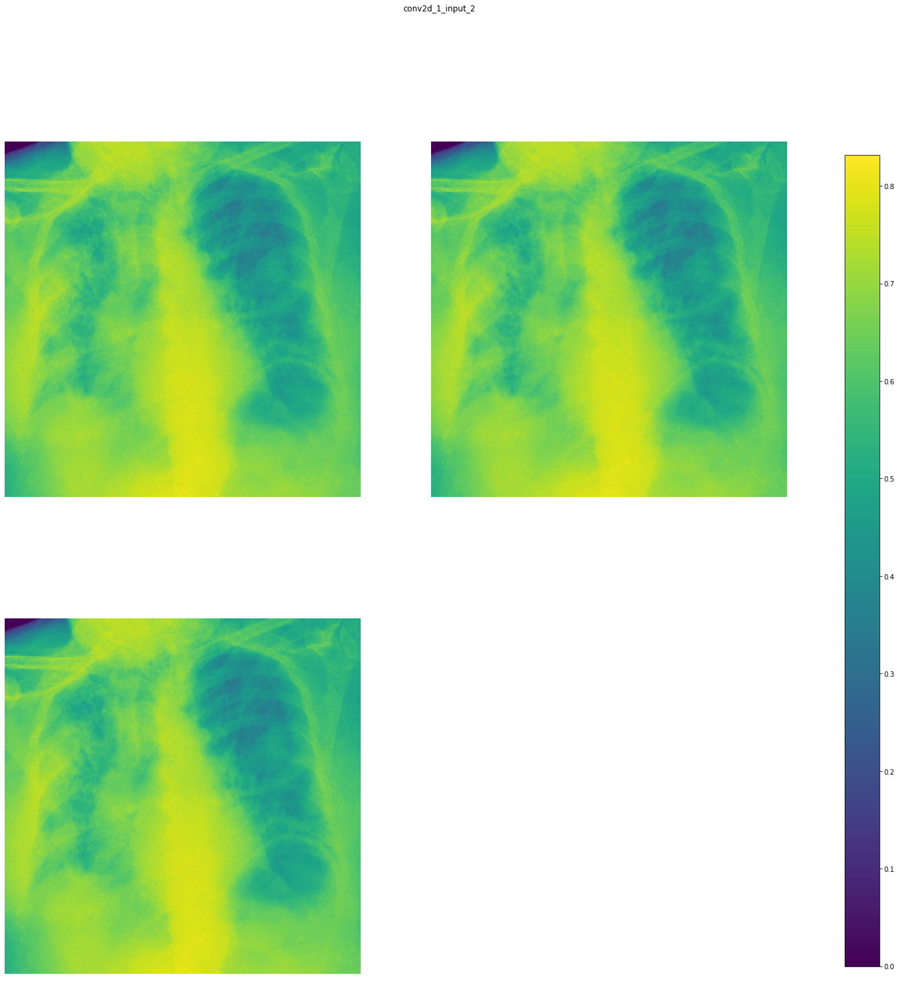

conv2d_1_2 (1, 222, 222, 32) 


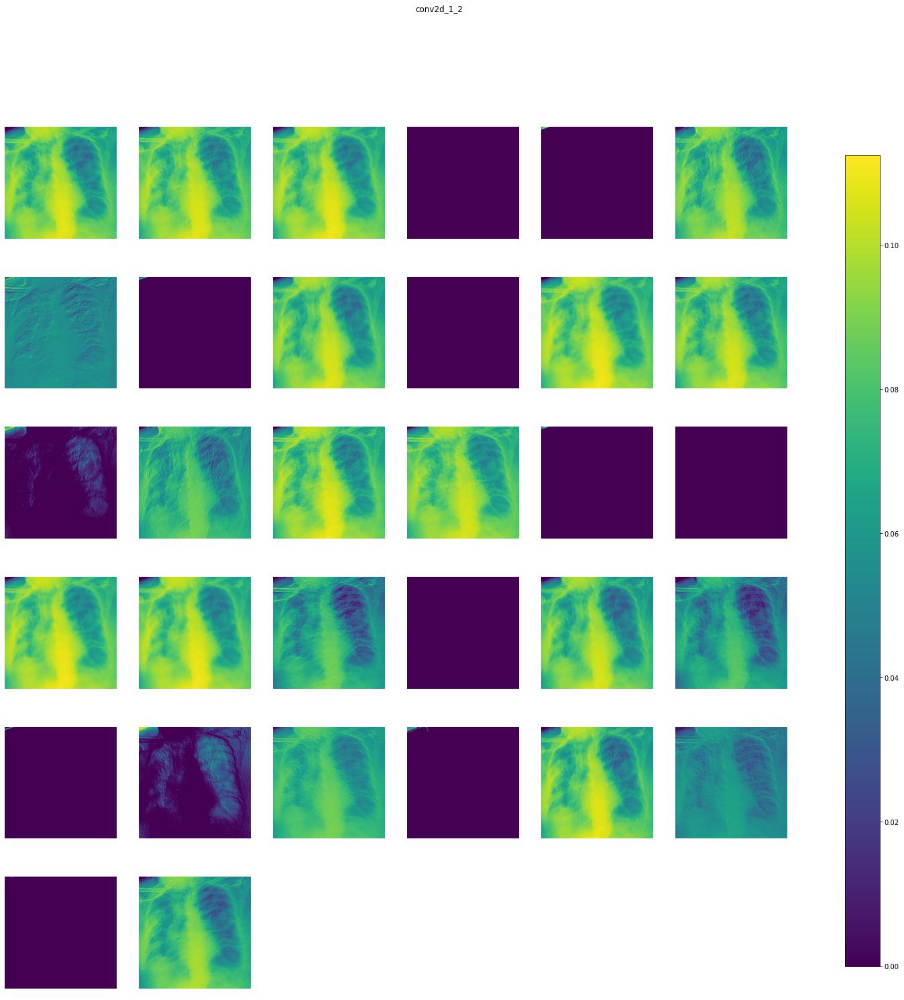

conv2d_2_2 (1, 220, 220, 64) 


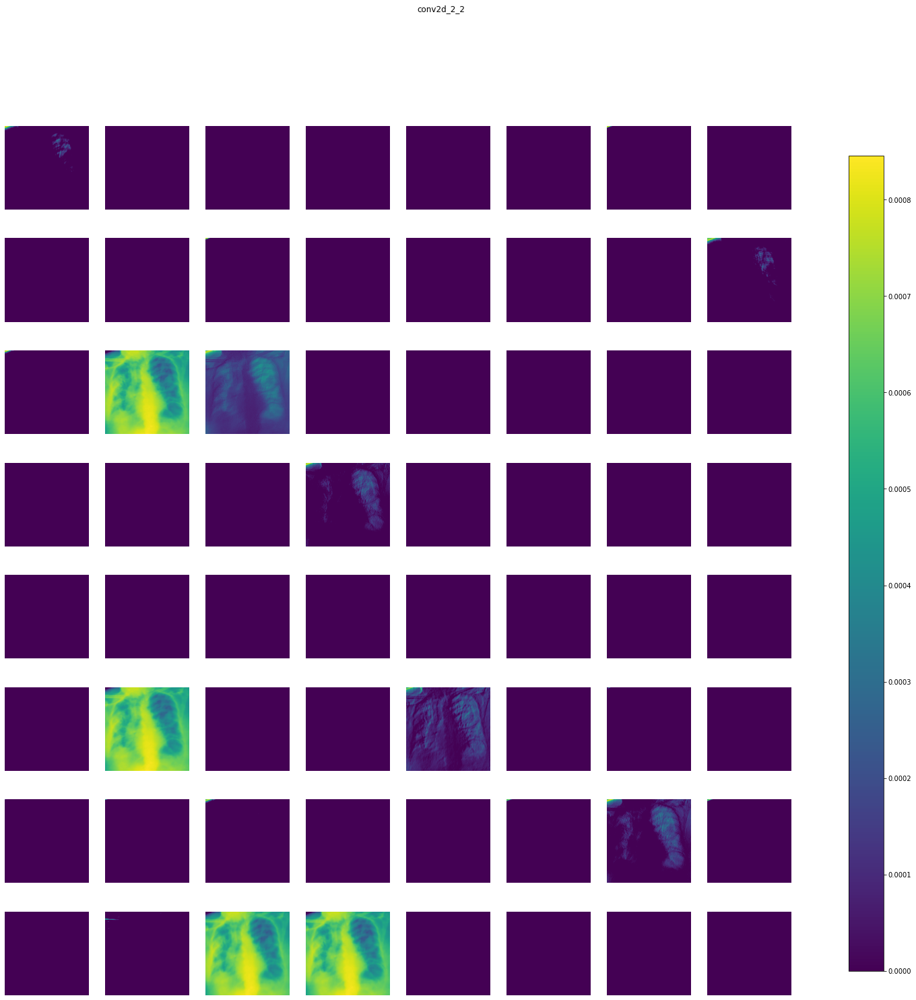

max_pooling2d_1_2 (1, 110, 110, 64) 


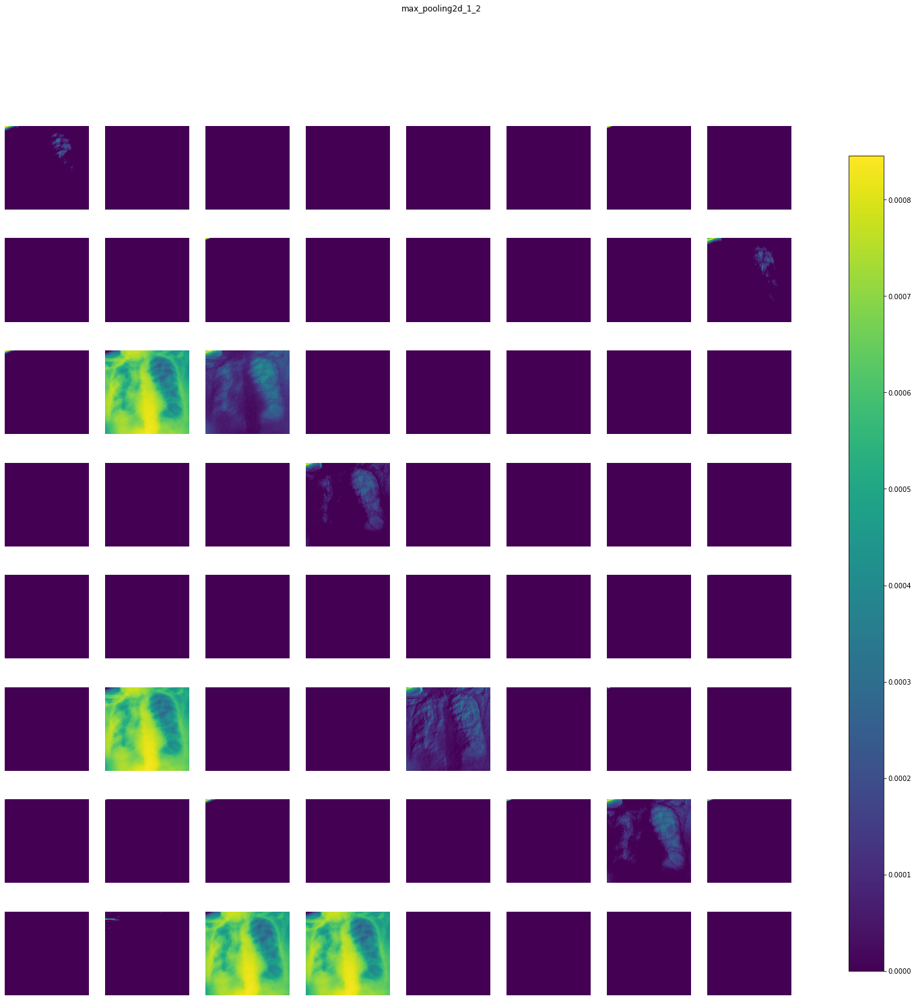

dropout_1_2 (1, 110, 110, 64) 


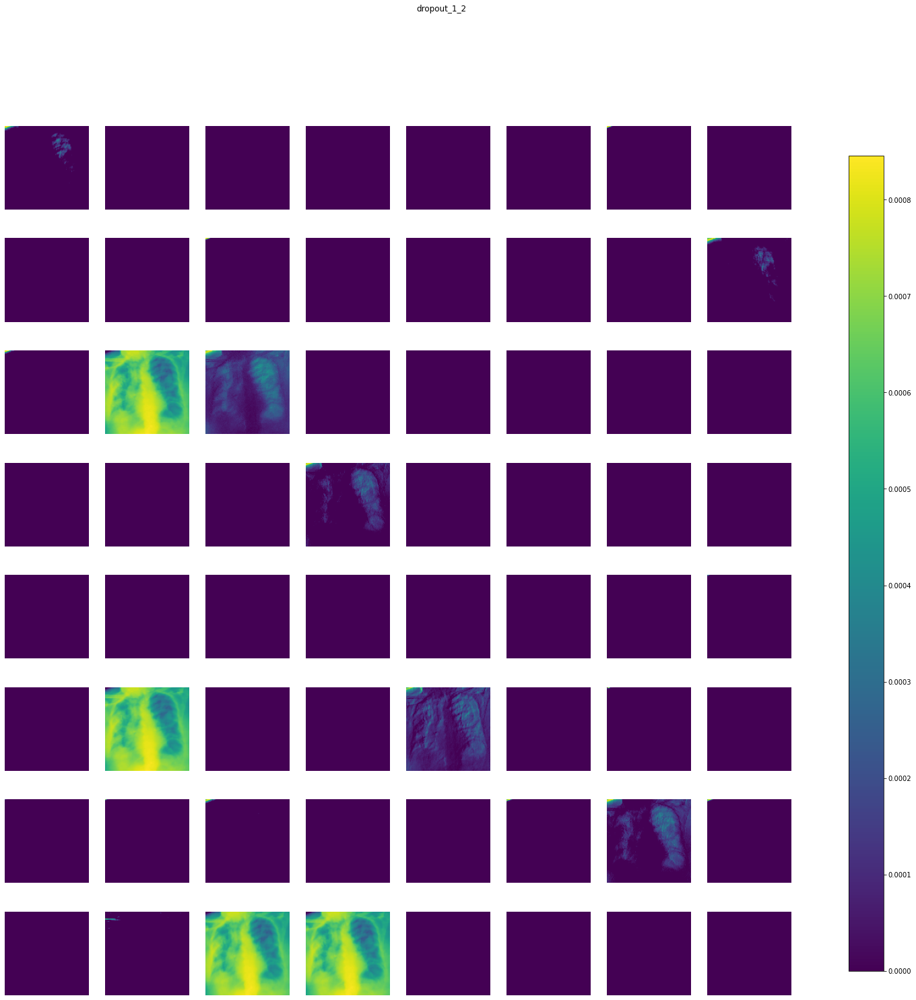

conv2d_3_2 (1, 108, 108, 64) 


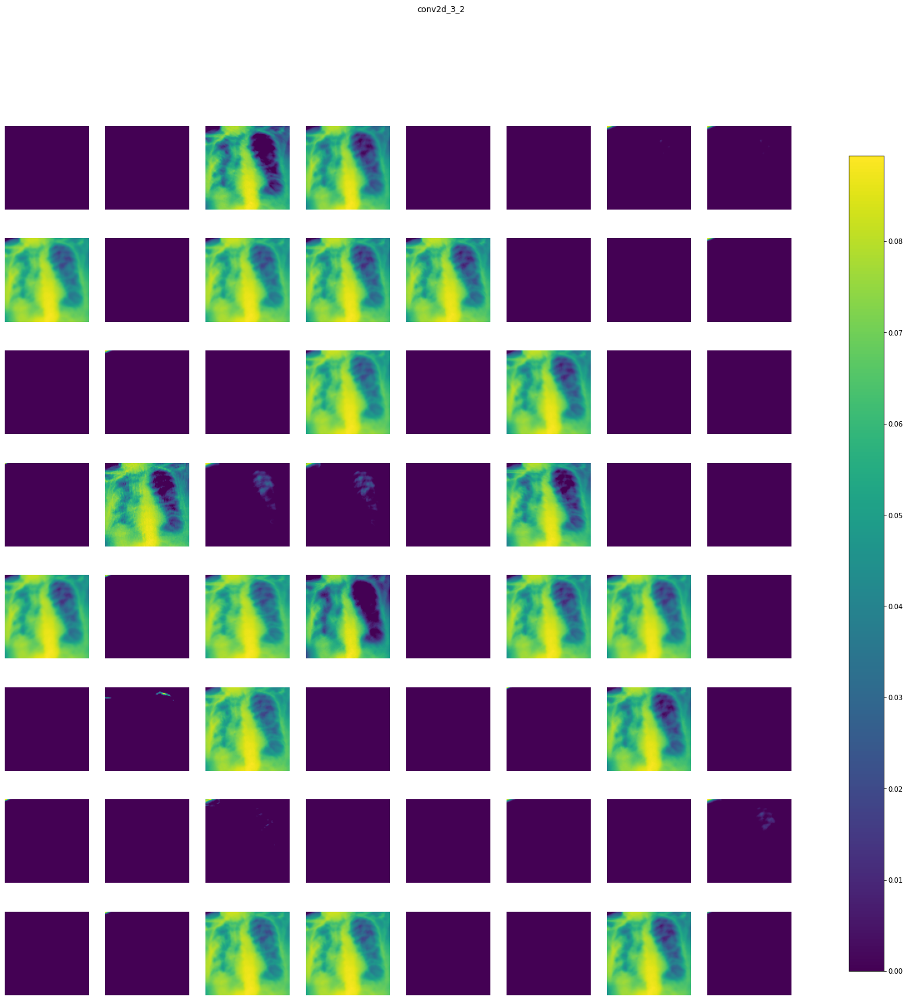

max_pooling2d_2_2 (1, 54, 54, 64) 


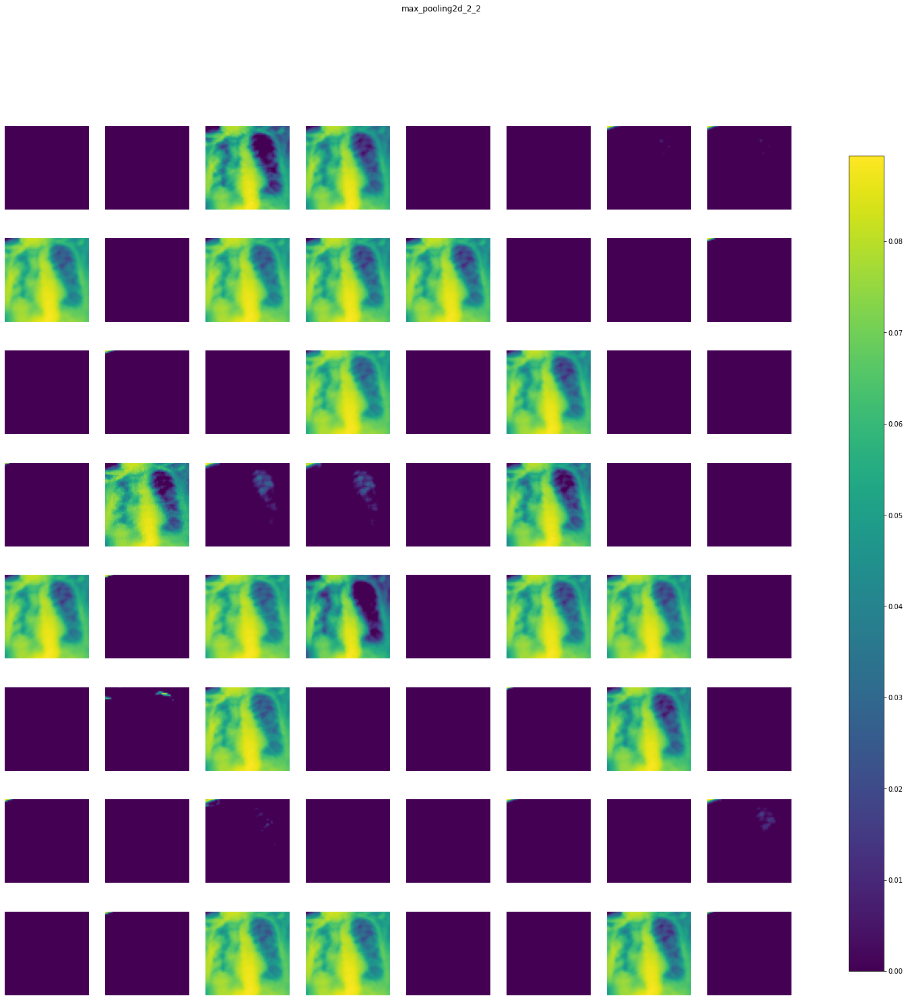

dropout_2_2 (1, 54, 54, 64) 


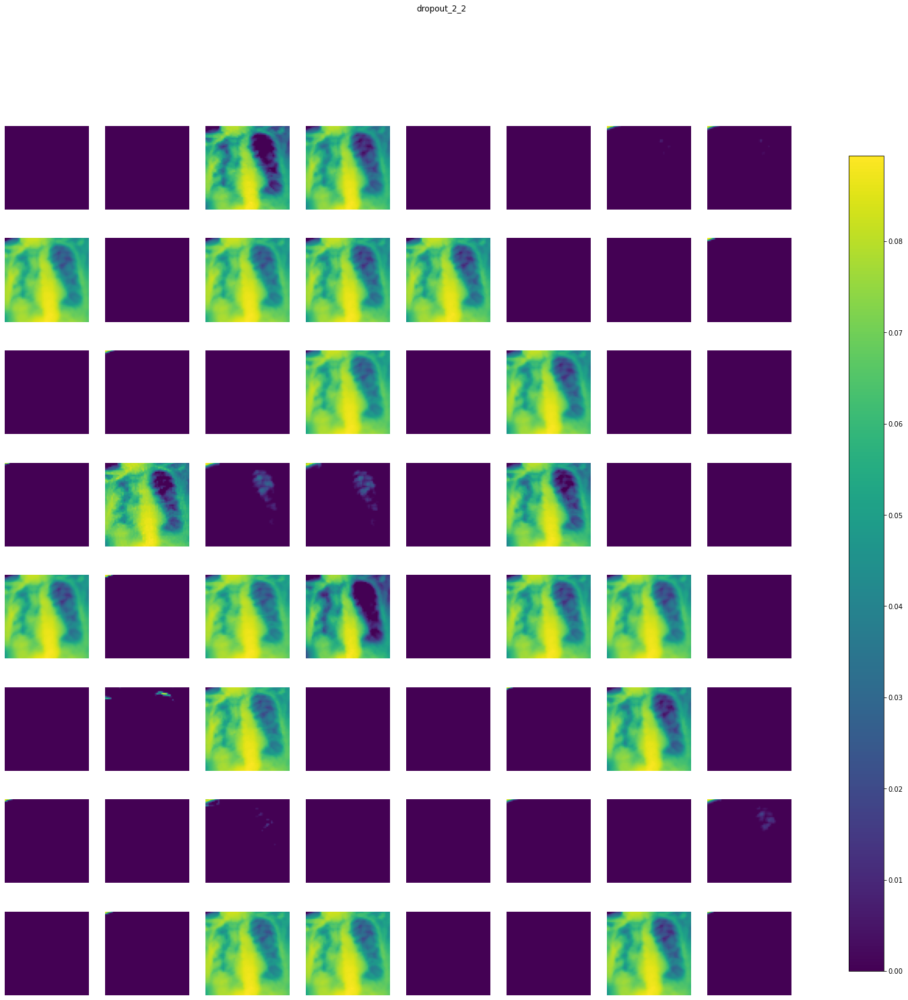

conv2d_4_2 (1, 52, 52, 128) 


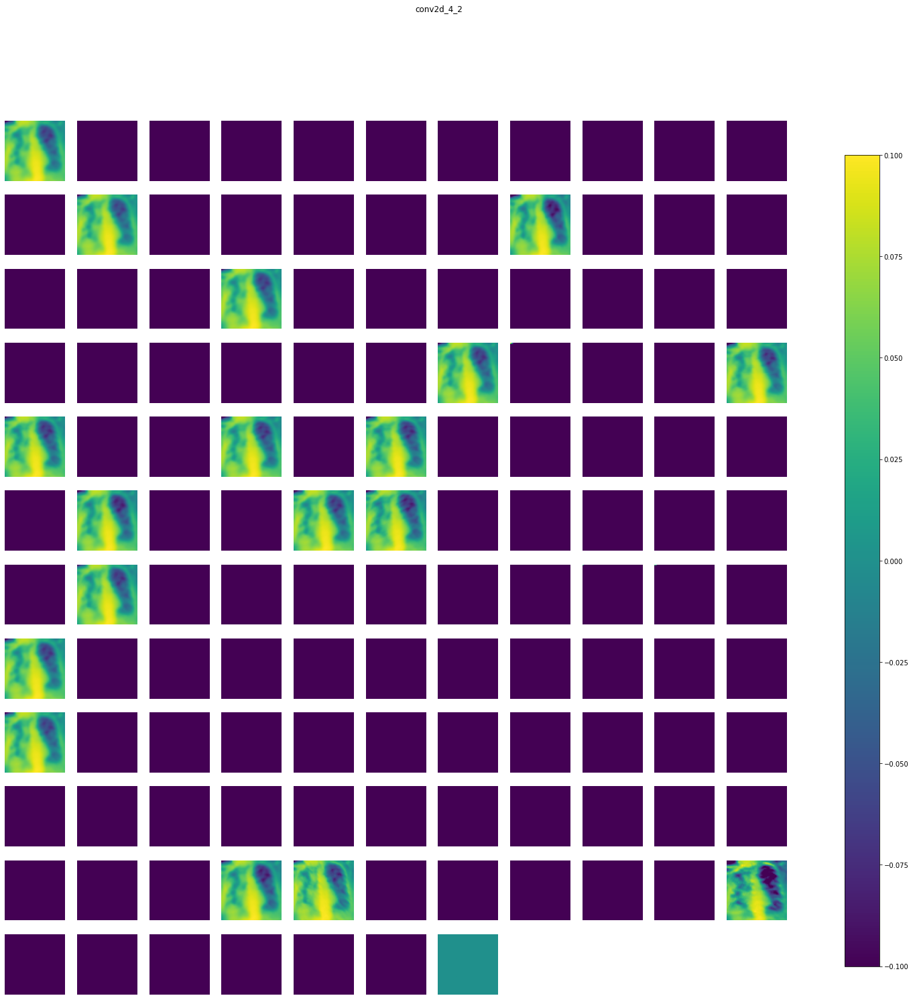

max_pooling2d_3_2 (1, 26, 26, 128) 


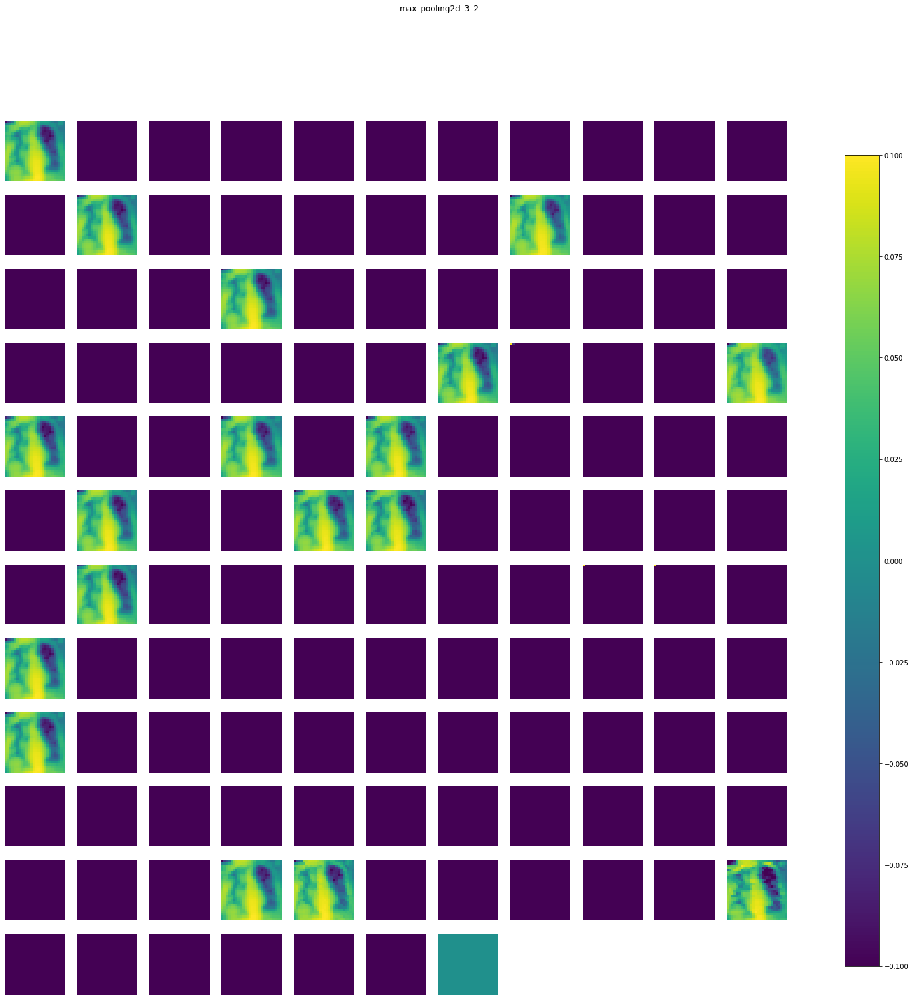

dropout_3_2 (1, 26, 26, 128) 


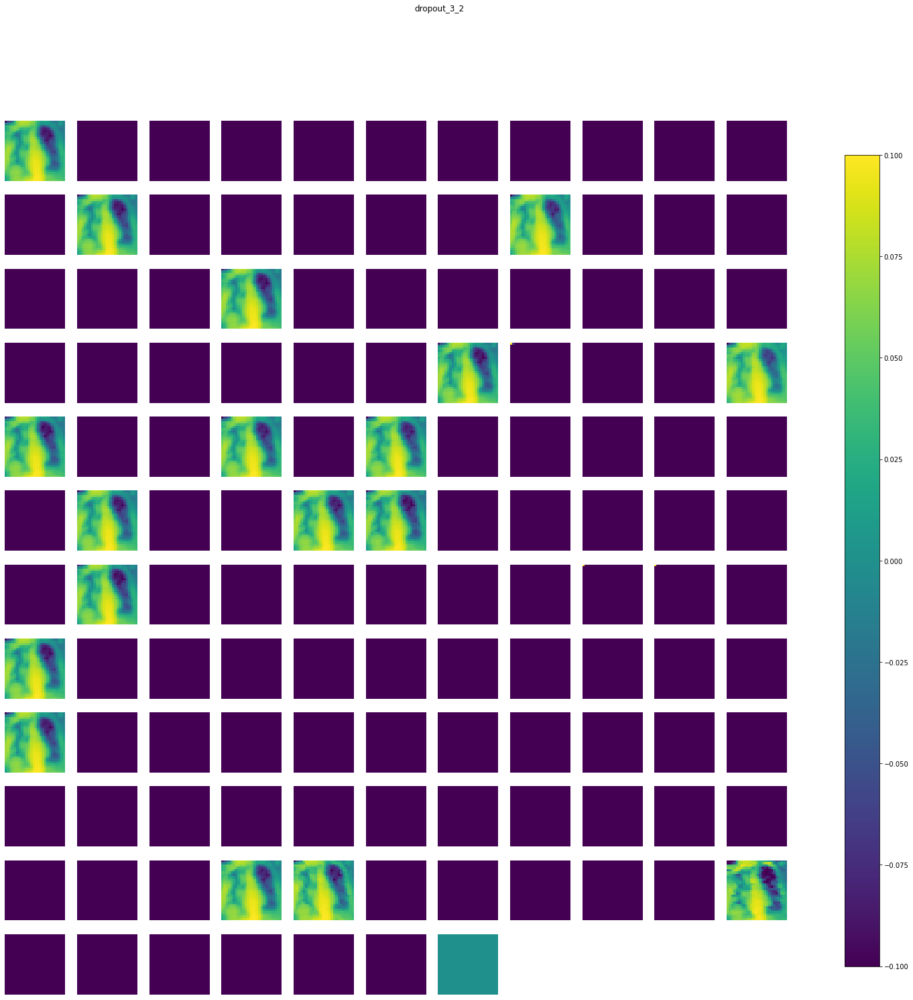

flatten_1_2 (1, 86528) 


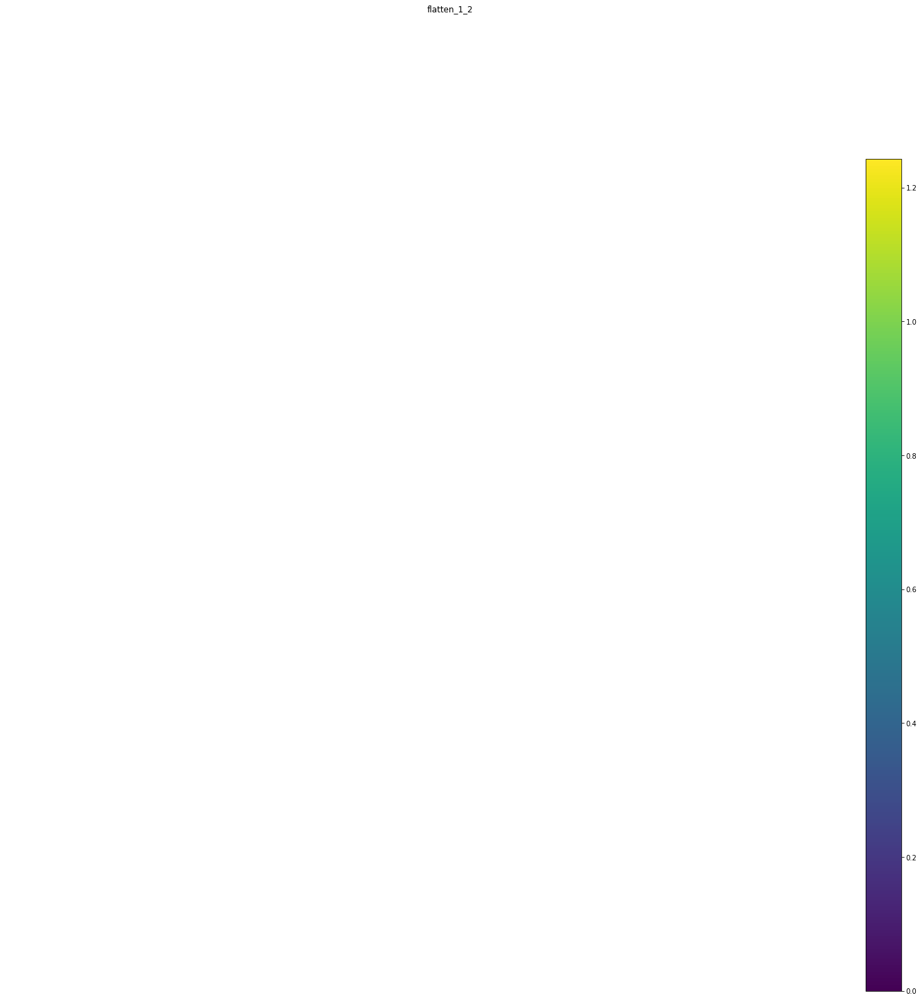

dense_1_2 (1, 64) 


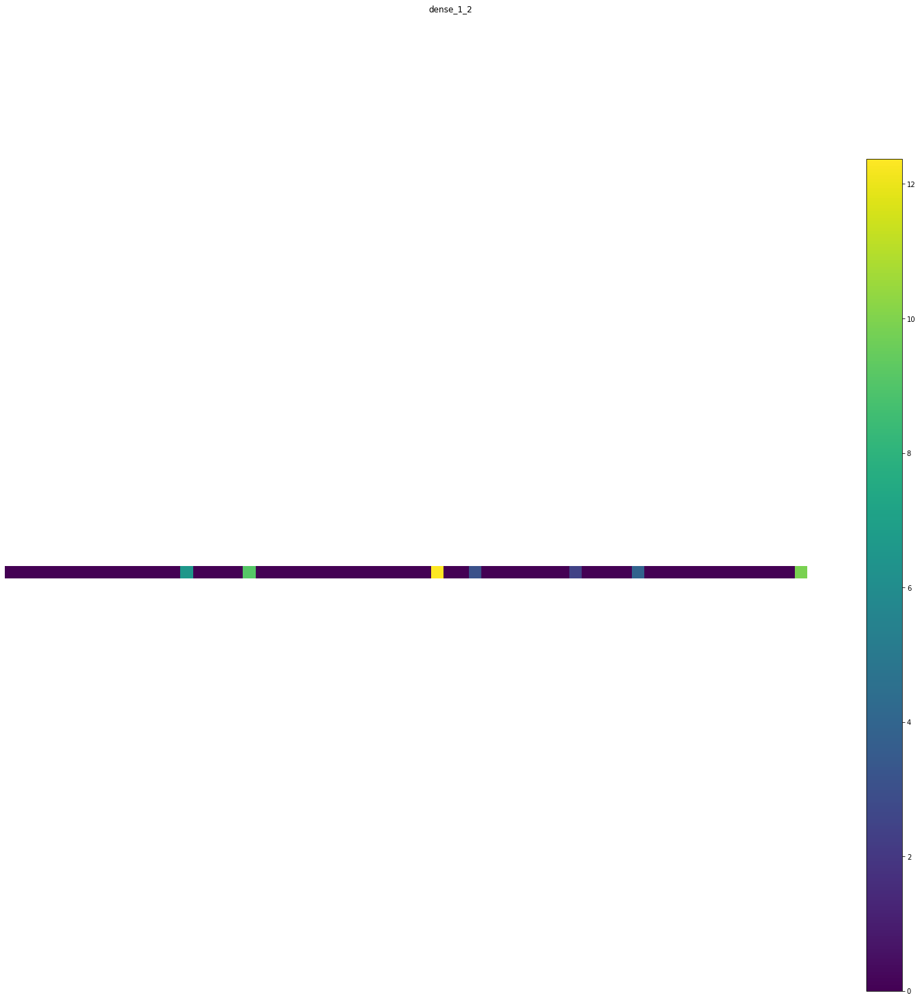

dropout_4_2 (1, 64) 


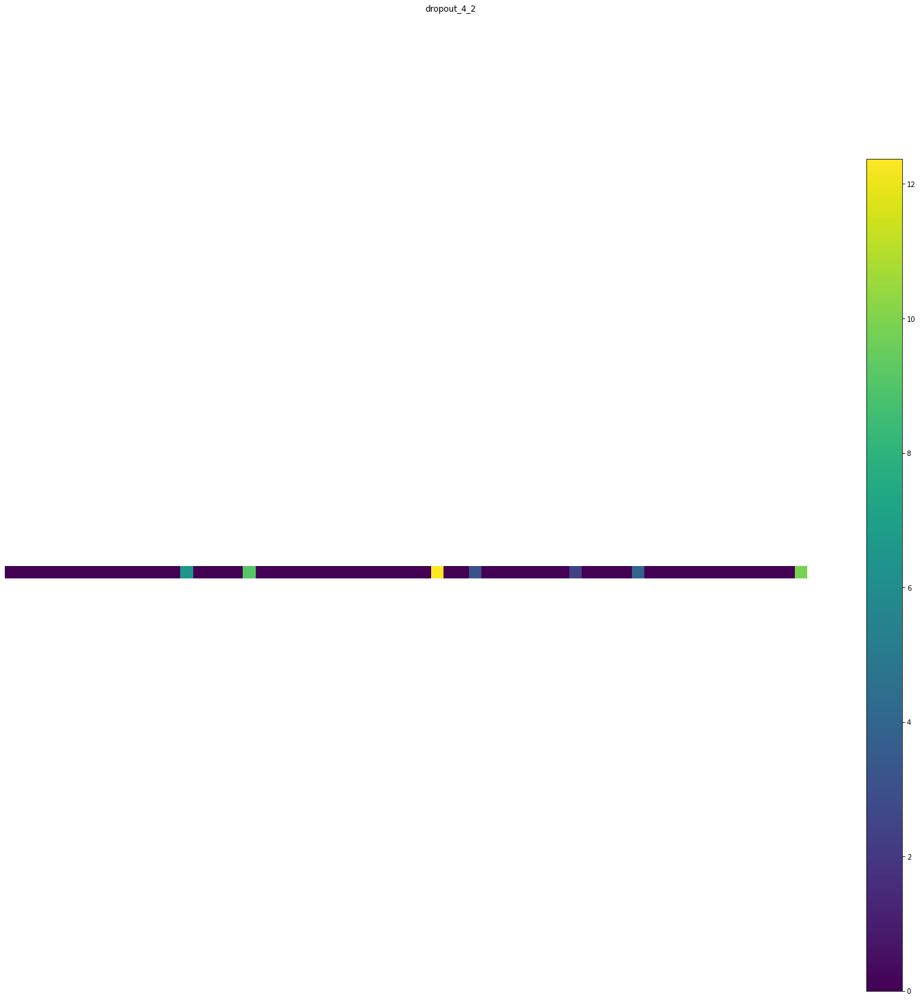

dense_2_2 (1, 1) 


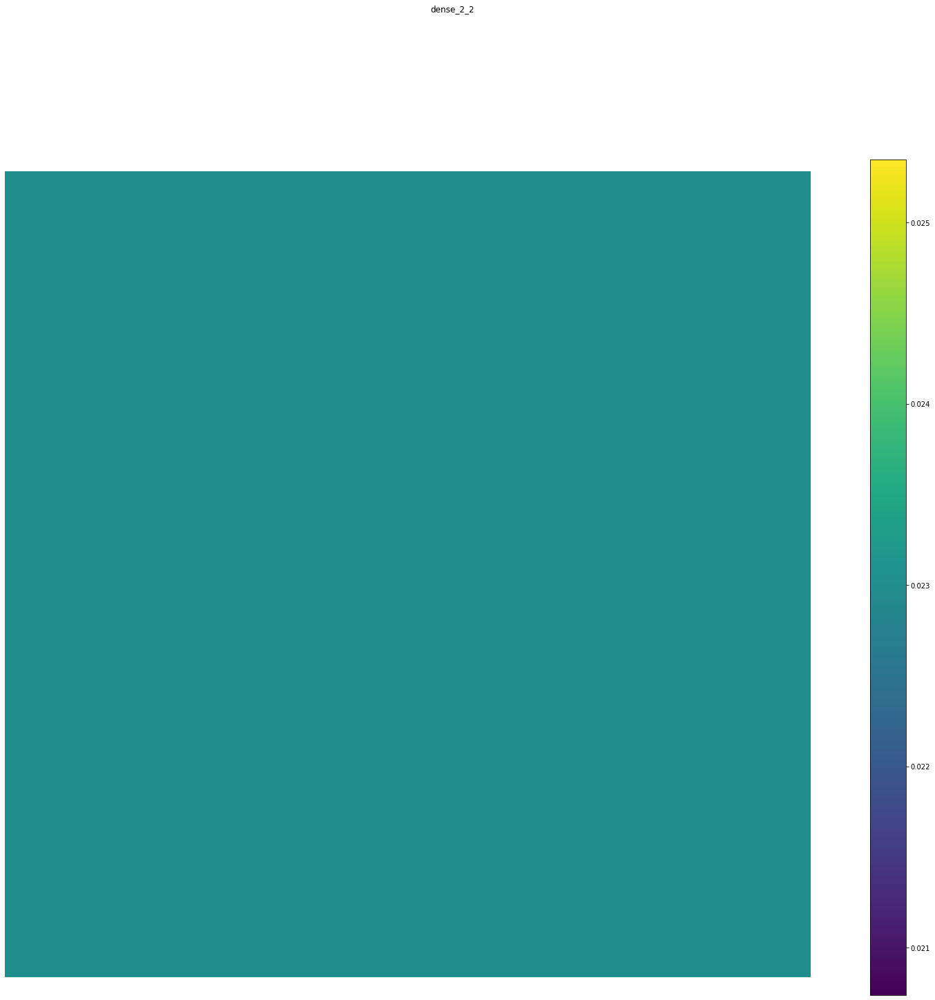

In [0]:
from keract import display_activations
display_activations(activations, save=False)

### Heatmap after various layers

conv2d_1_input_2 (1, 224, 224, 3) 


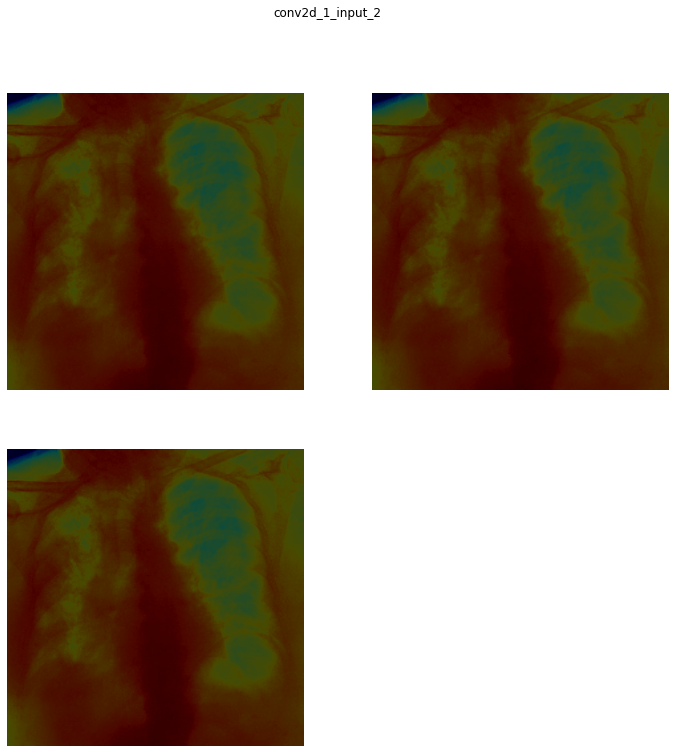

conv2d_1_2 (1, 222, 222, 32) 


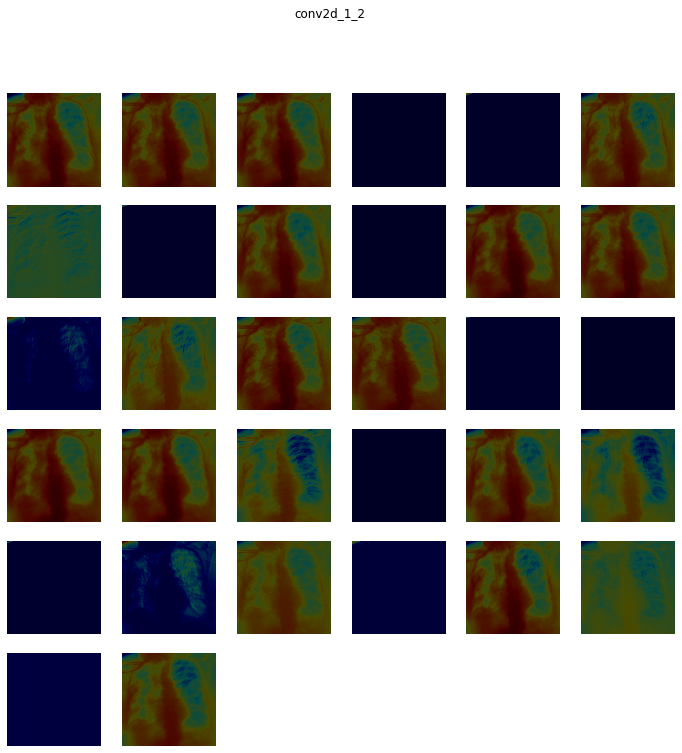

conv2d_2_2 (1, 220, 220, 64) 


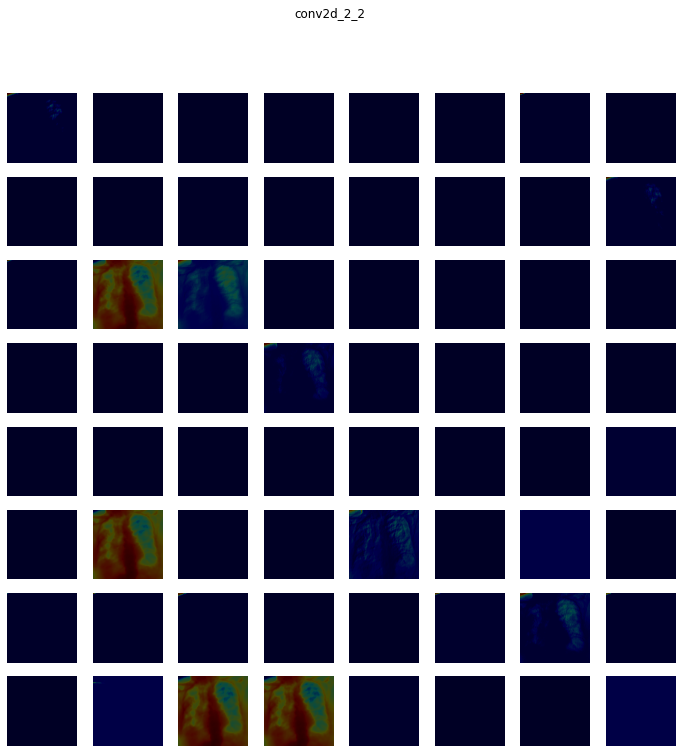

max_pooling2d_1_2 (1, 110, 110, 64) 


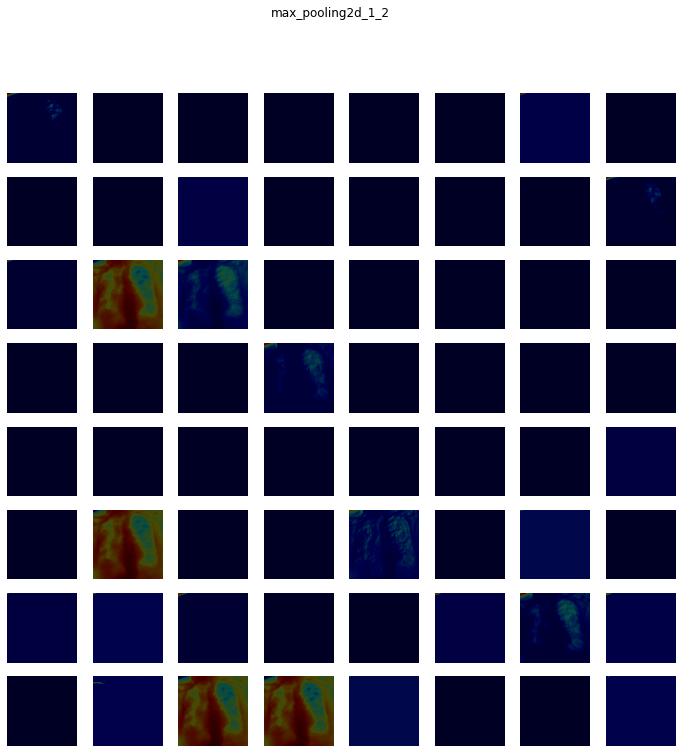

dropout_1_2 (1, 110, 110, 64) 


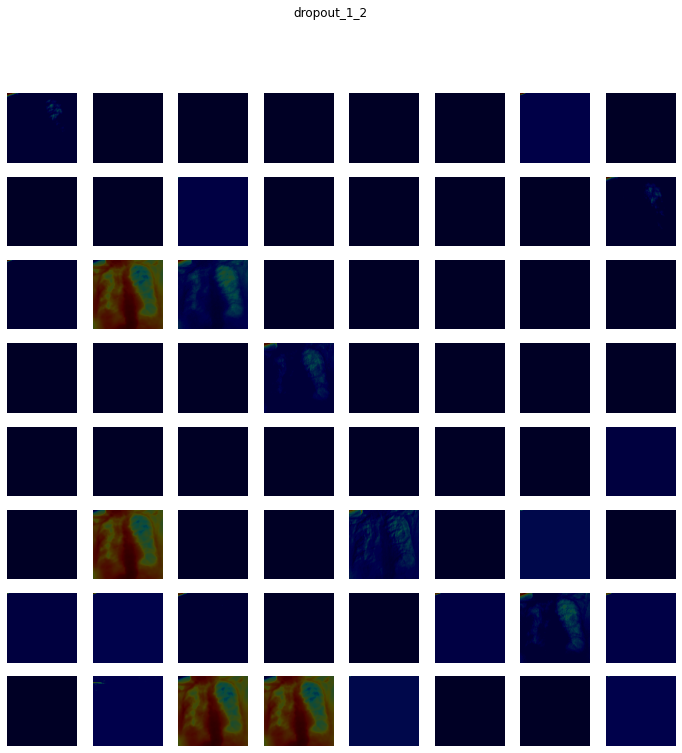

conv2d_3_2 (1, 108, 108, 64) 


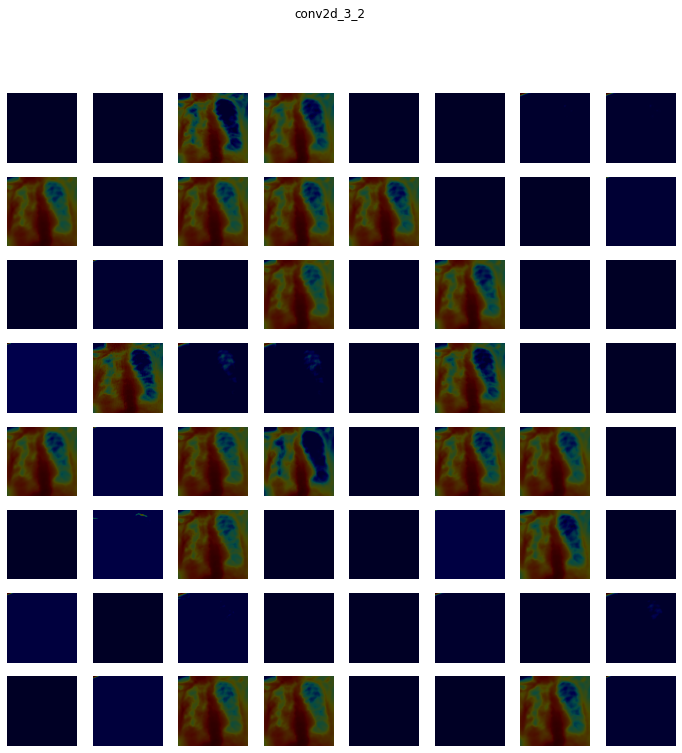

max_pooling2d_2_2 (1, 54, 54, 64) 


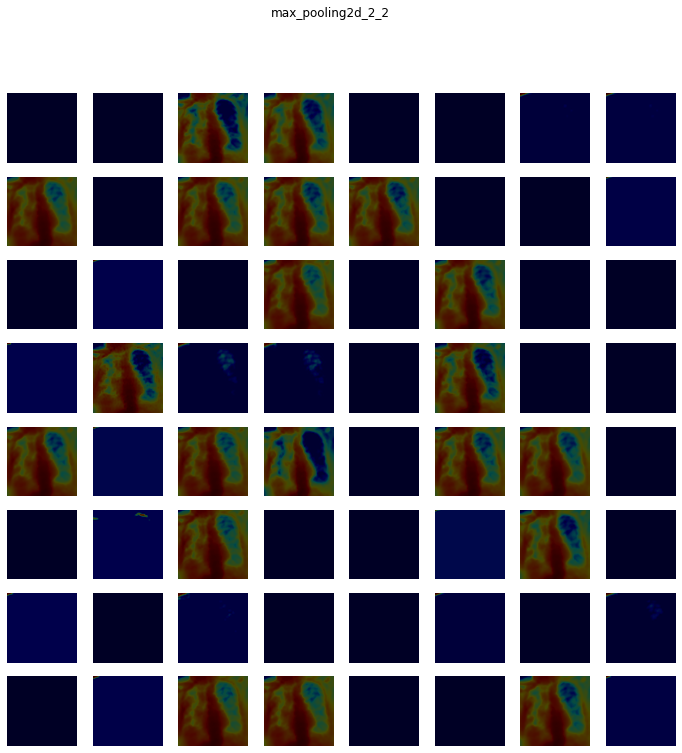

dropout_2_2 (1, 54, 54, 64) 


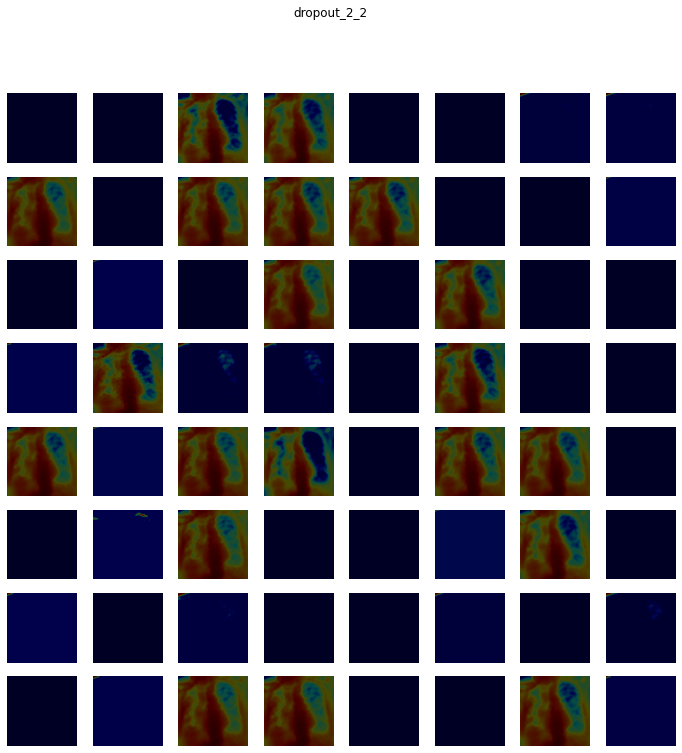

conv2d_4_2 (1, 52, 52, 128) 


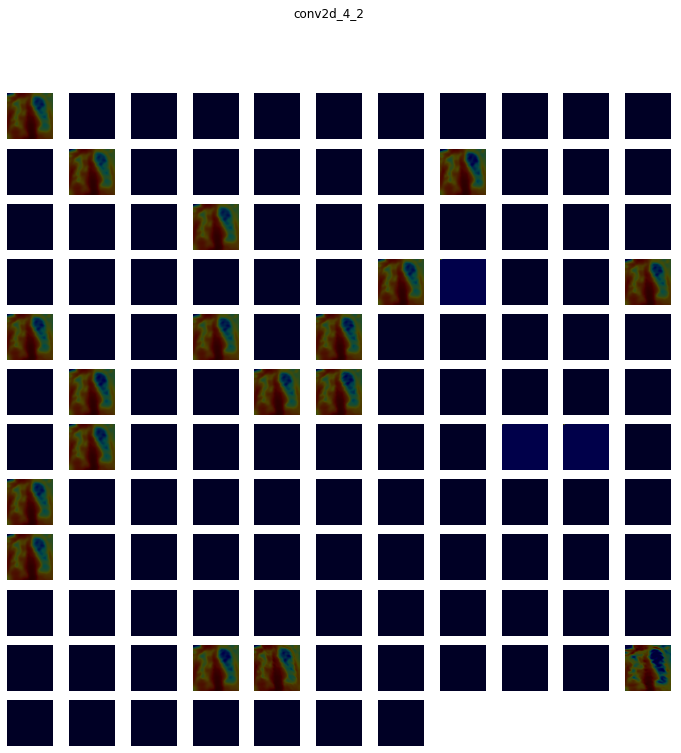

max_pooling2d_3_2 (1, 26, 26, 128) 


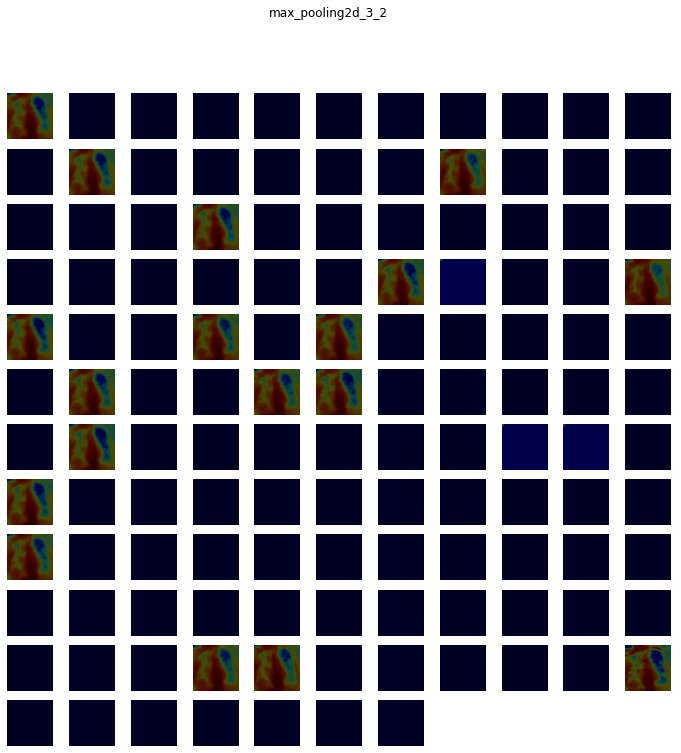

dropout_3_2 (1, 26, 26, 128) 


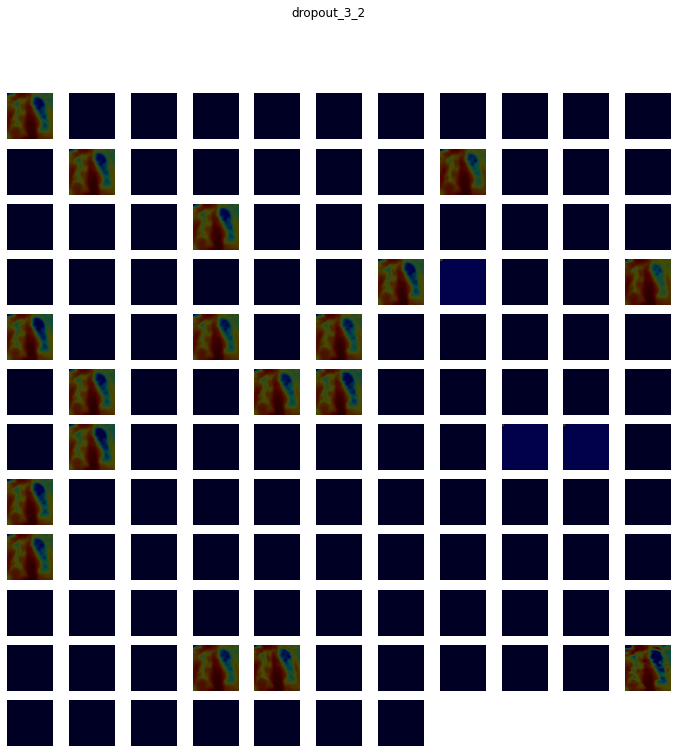

flatten_1_2 (1, 86528) -> Skipped. 2D Activations.
dense_1_2 (1, 64) -> Skipped. 2D Activations.
dropout_4_2 (1, 64) -> Skipped. 2D Activations.
dense_2_2 (1, 1) -> Skipped. 2D Activations.


In [0]:
from keract import display_heatmaps
display_heatmaps(activations, x, save=False)

#Visualization for negetive case

In [0]:
img = '/content/CovidDataset/Train/Normal/NORMAL2-IM-1346-0001.jpeg'

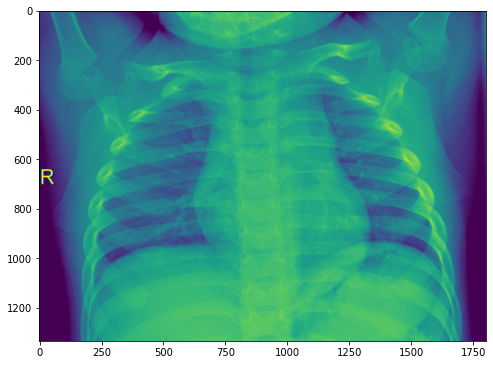

In [0]:
import matplotlib.pyplot as plt
import PIL
plt.figure(figsize=(8,7))
plt.imshow(PIL.Image.open(img))
plt.show()

In [0]:
x = preprocess_image(img_path=img,model=model,resize=(224,224))

In [0]:
model.predict_classes(x)

array([[1]], dtype=int32)

In [0]:
from keract import get_activations
activations = get_activations(model, x)

# Display activations after layers

conv2d_1_input_2 (1, 224, 224, 3) 


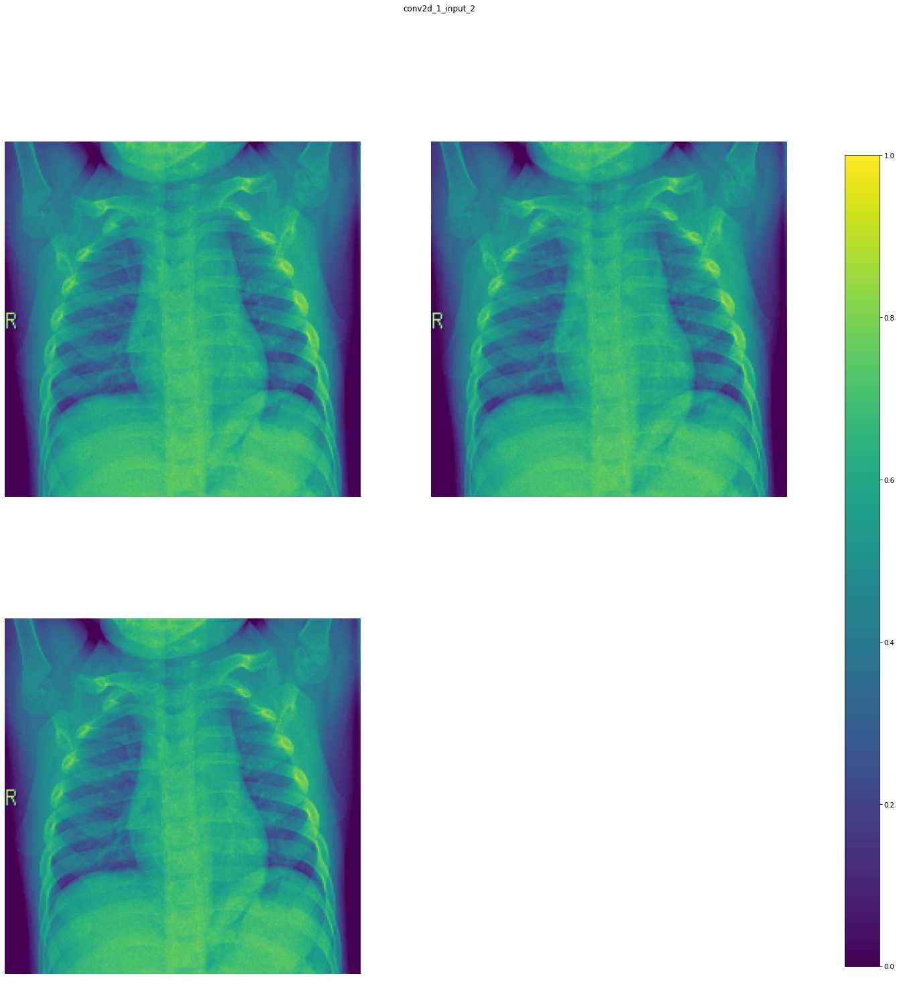

conv2d_1_2 (1, 222, 222, 32) 


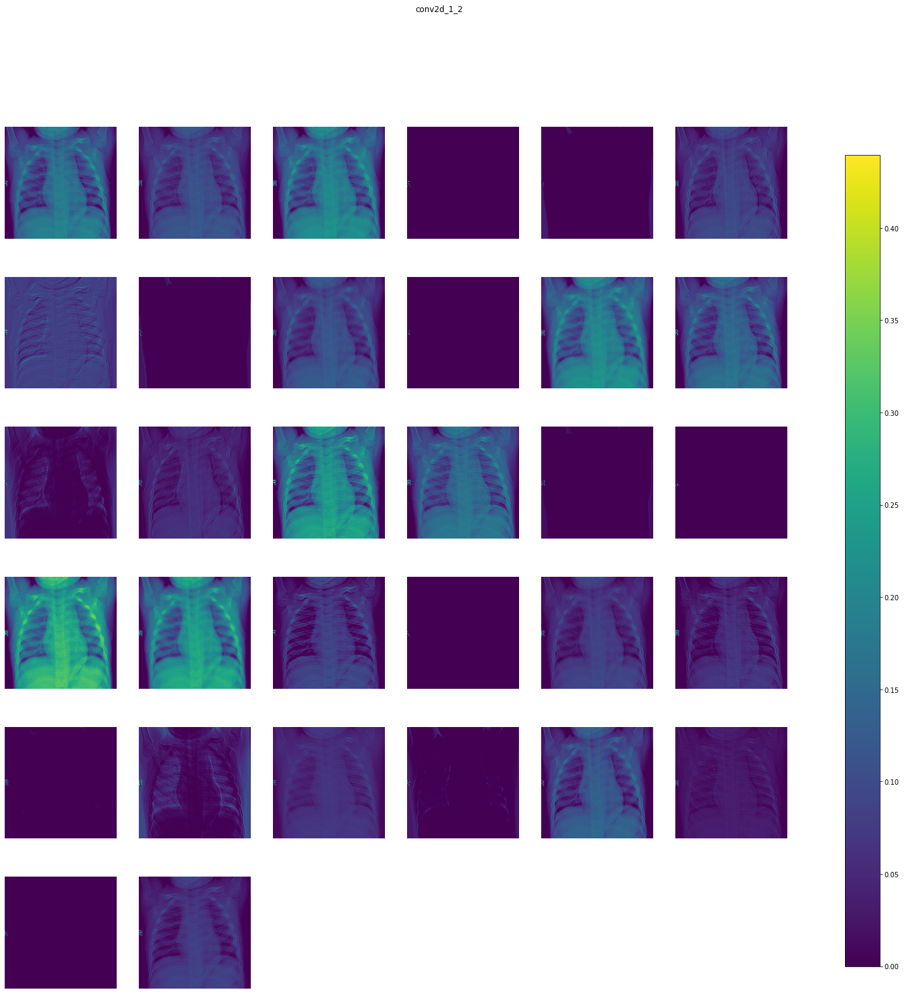

conv2d_2_2 (1, 220, 220, 64) 


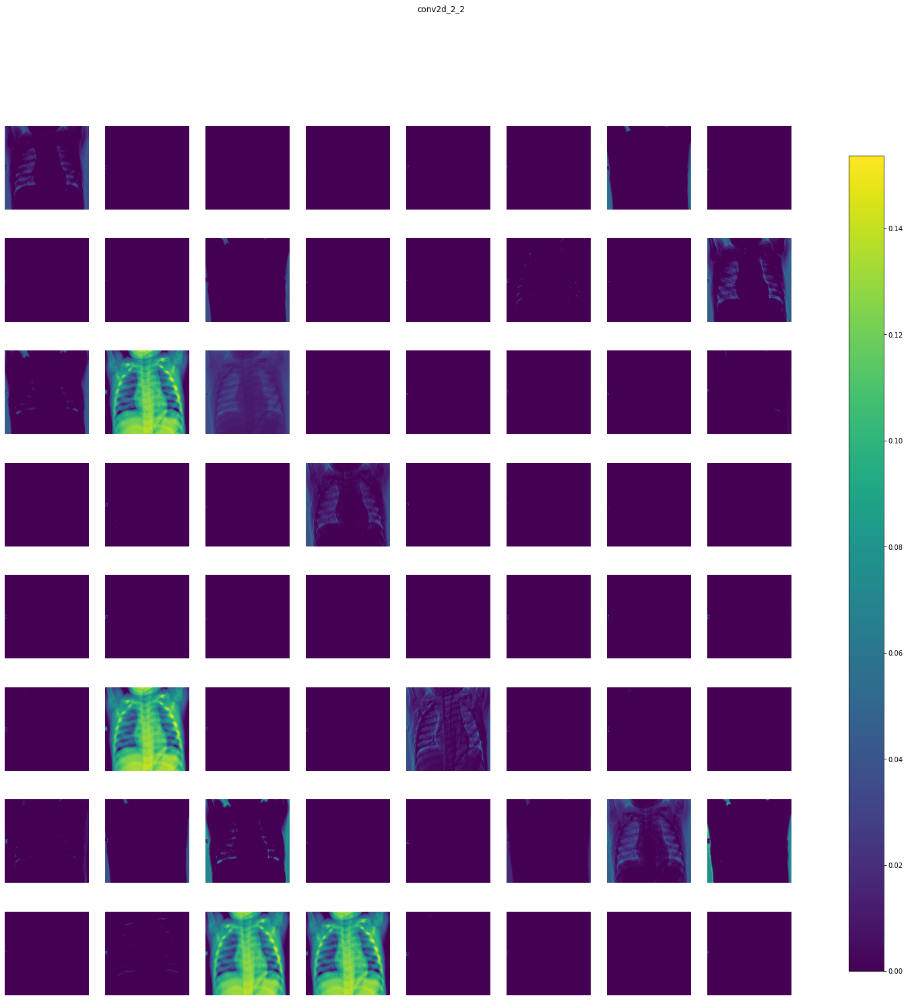

max_pooling2d_1_2 (1, 110, 110, 64) 


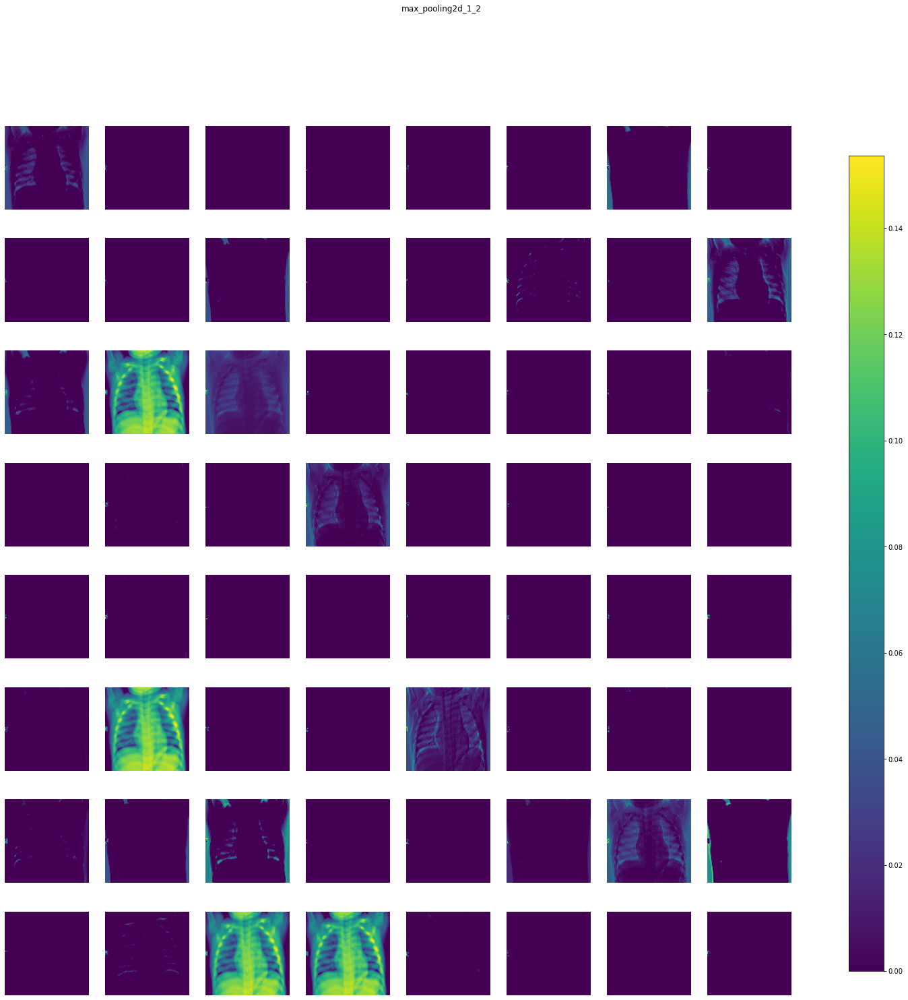

dropout_1_2 (1, 110, 110, 64) 


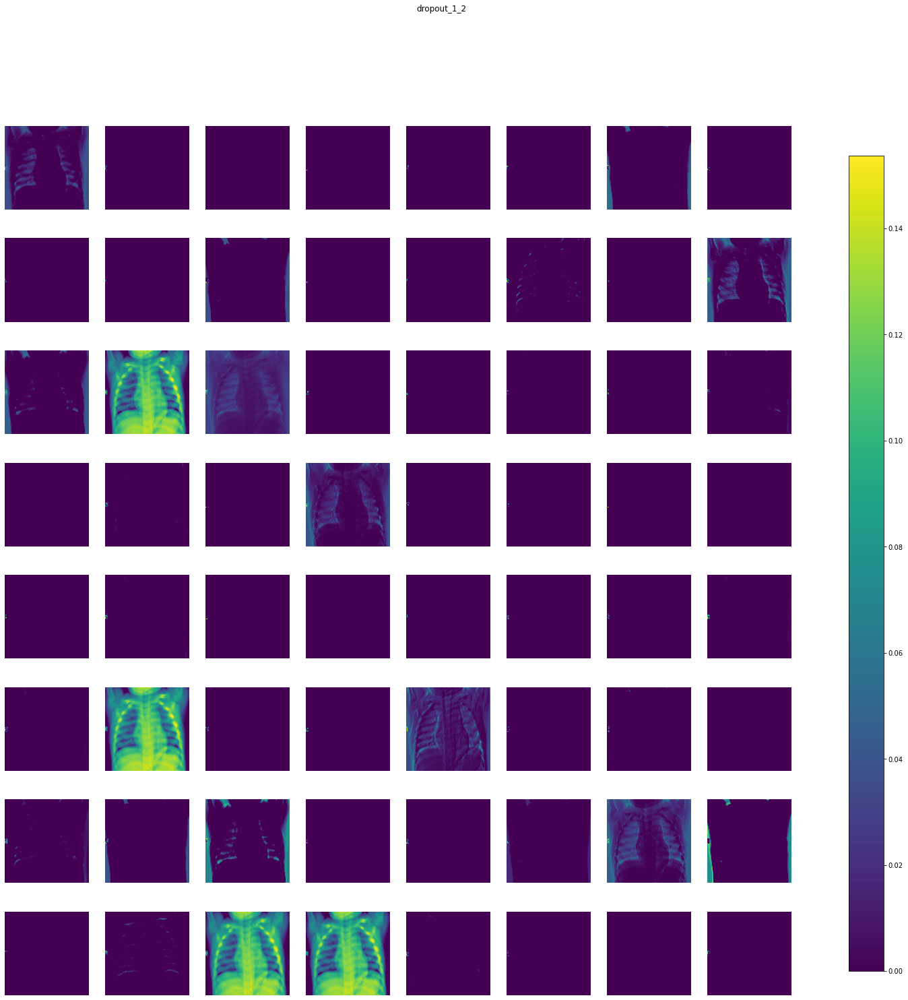

conv2d_3_2 (1, 108, 108, 64) 


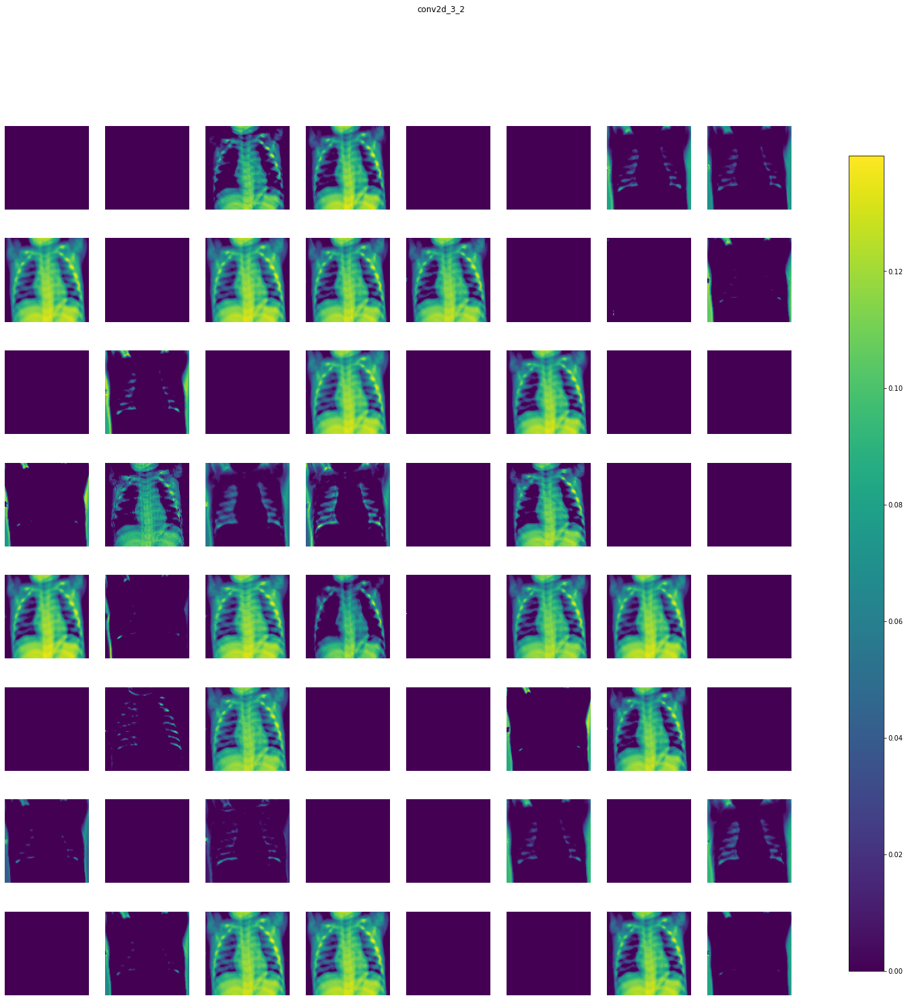

max_pooling2d_2_2 (1, 54, 54, 64) 


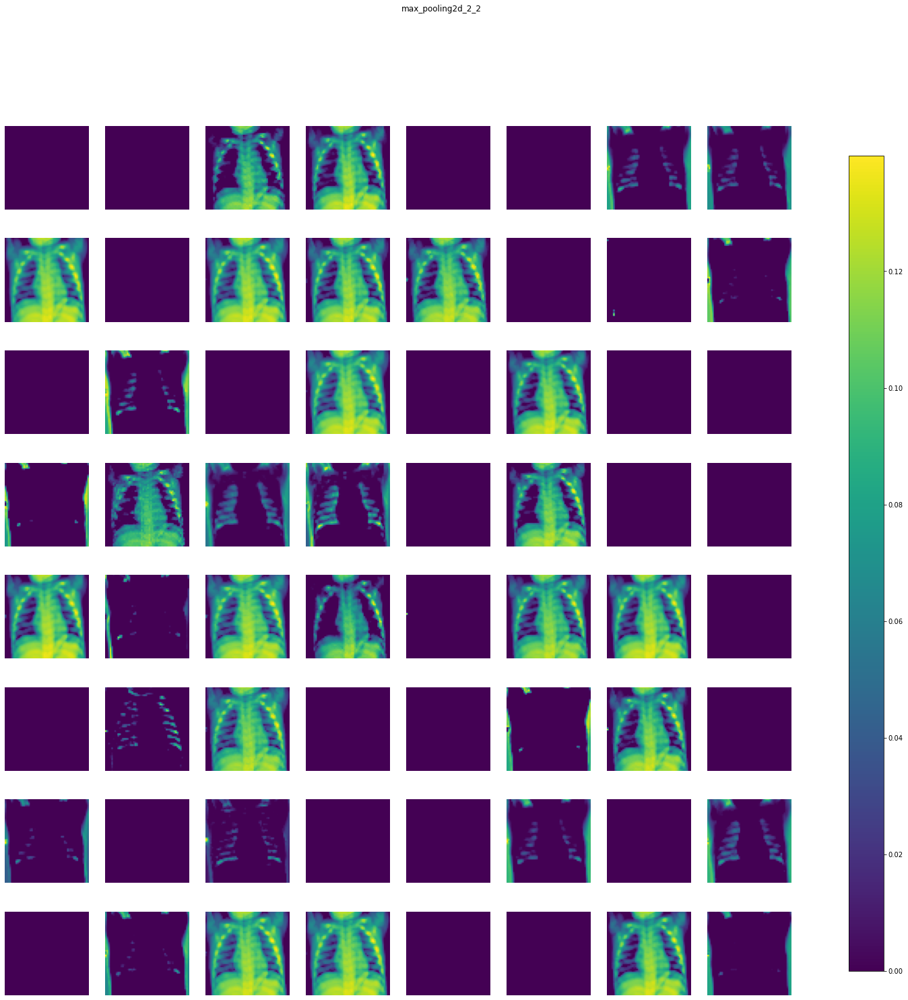

dropout_2_2 (1, 54, 54, 64) 


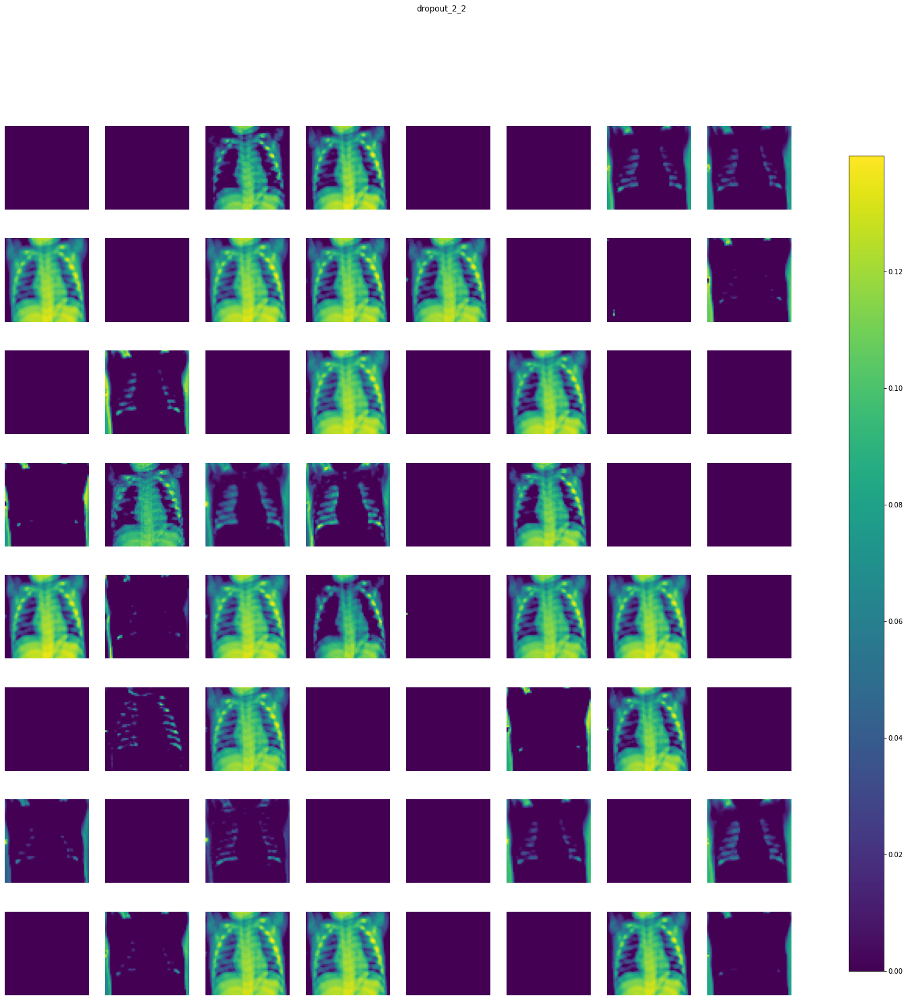

conv2d_4_2 (1, 52, 52, 128) 


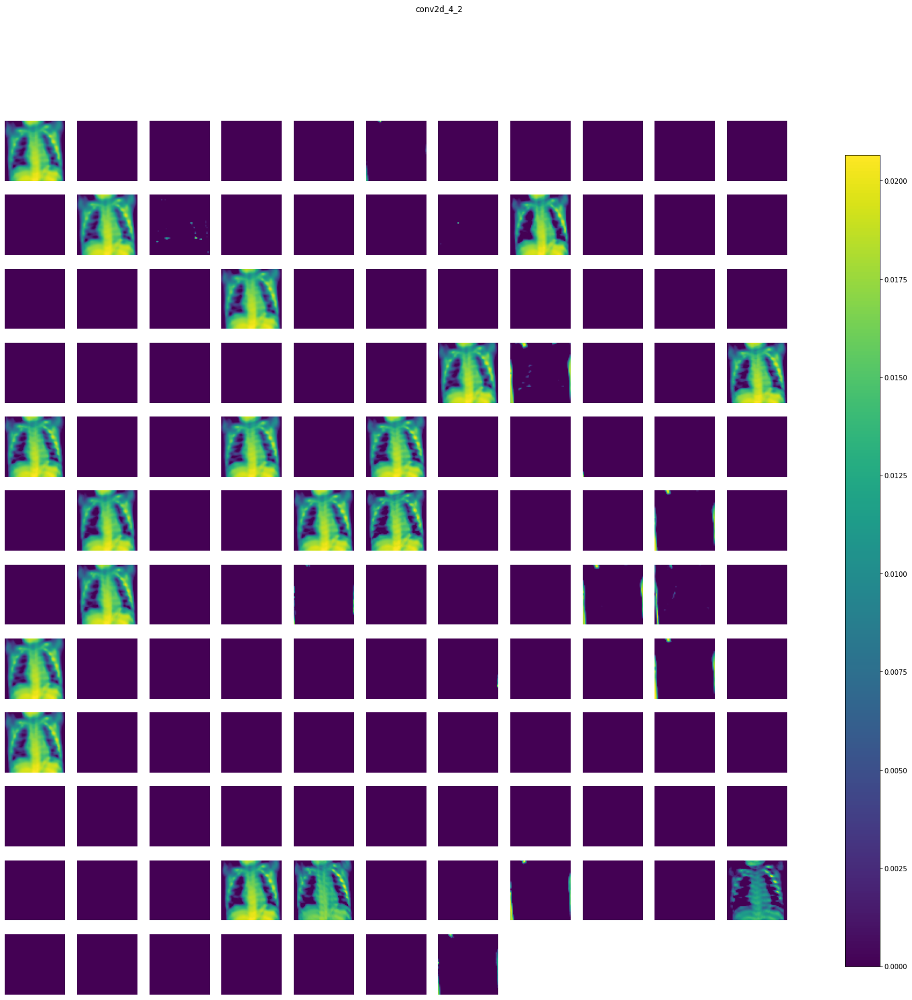

max_pooling2d_3_2 (1, 26, 26, 128) 


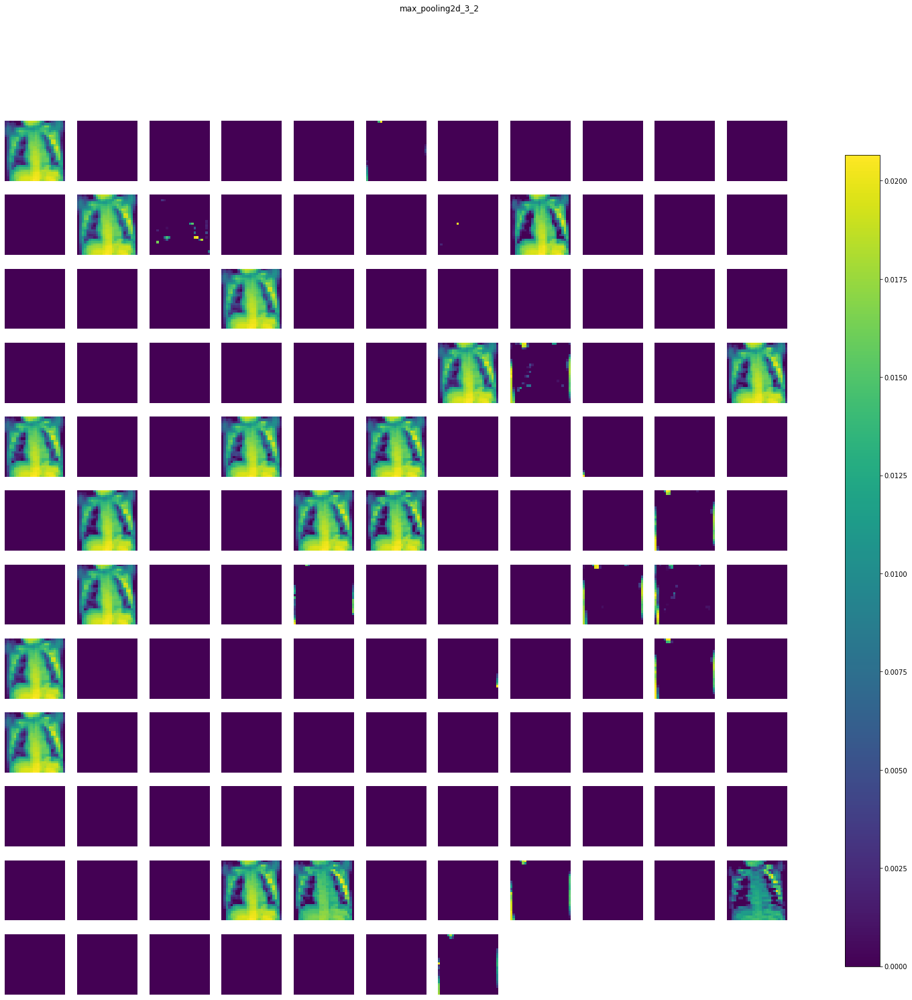

dropout_3_2 (1, 26, 26, 128) 


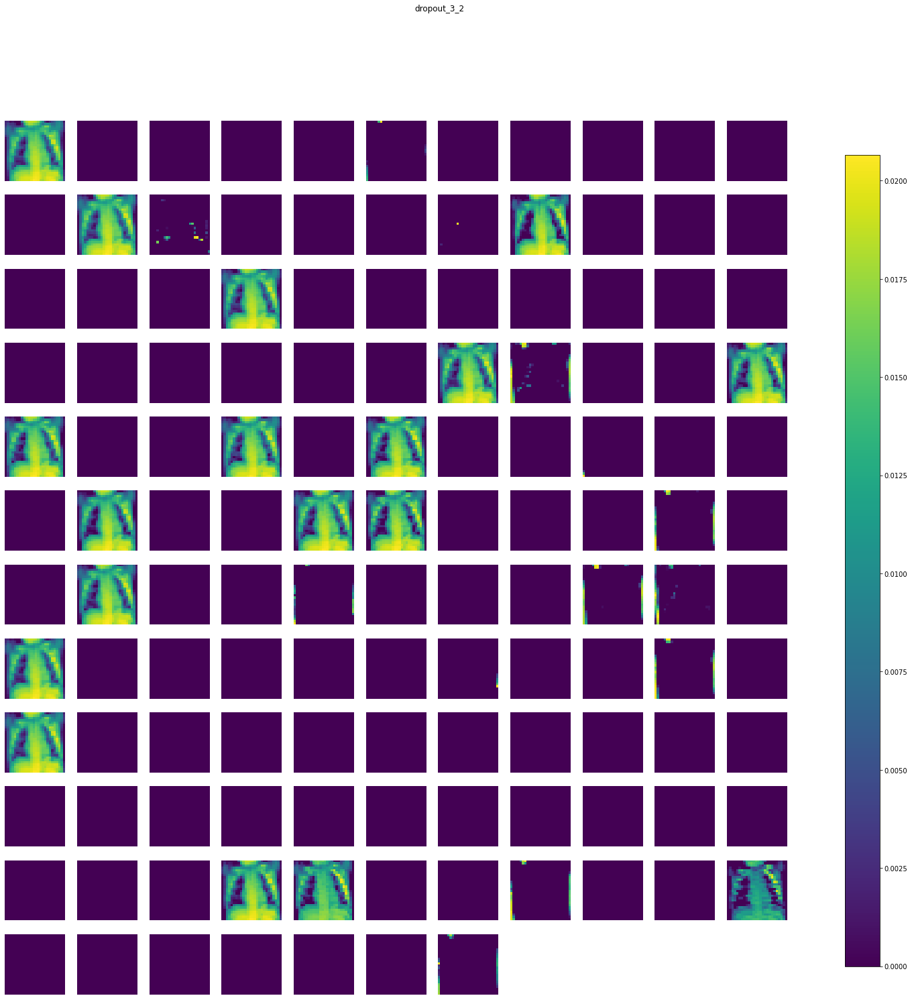

flatten_1_2 (1, 86528) 


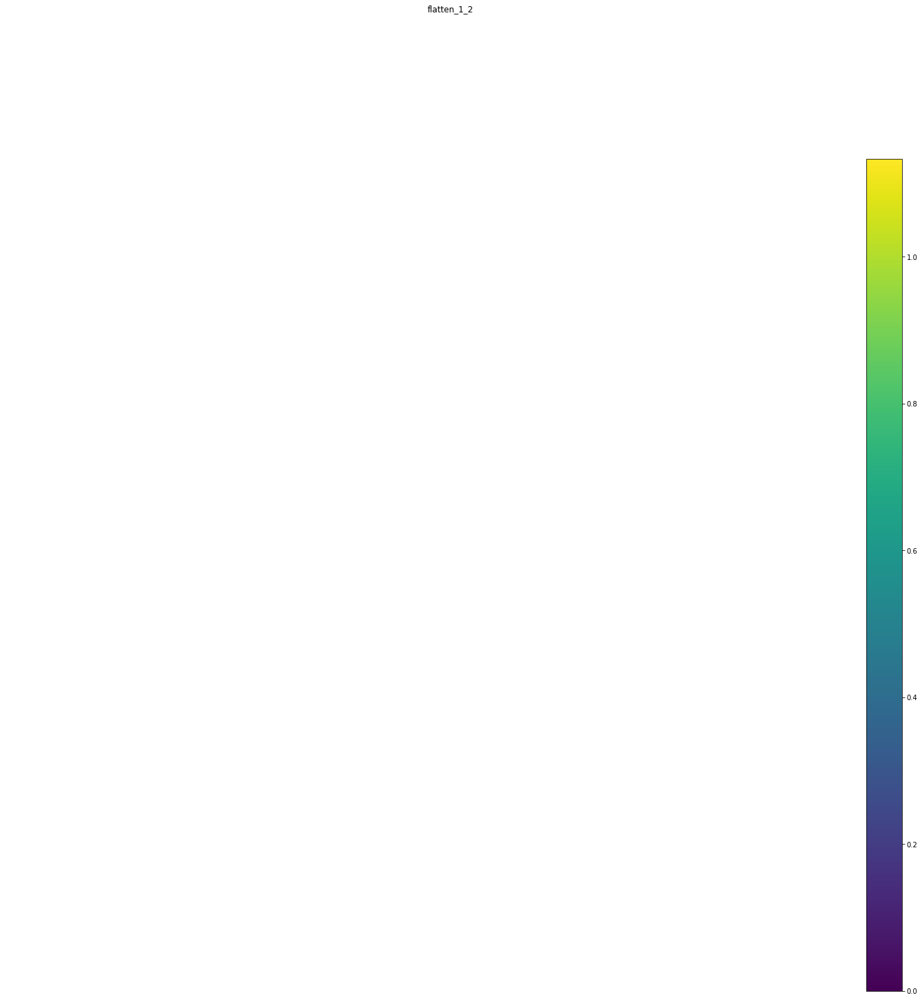

dense_1_2 (1, 64) 


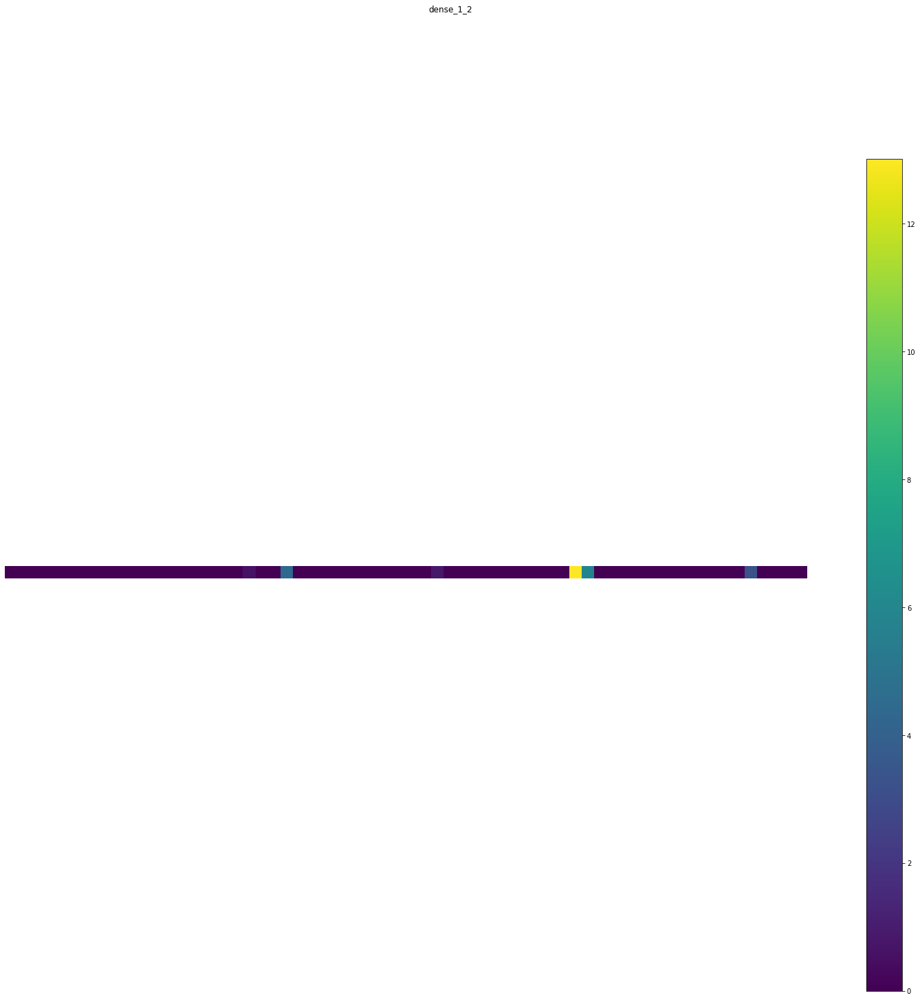

dropout_4_2 (1, 64) 


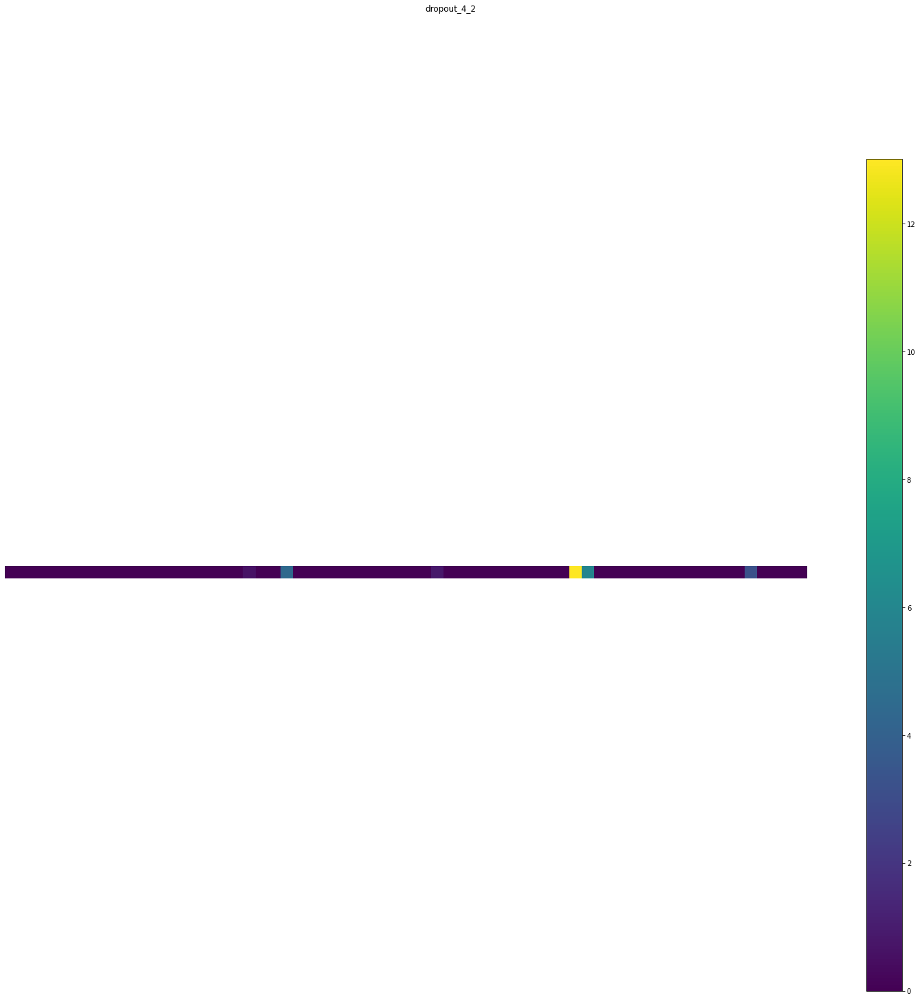

dense_2_2 (1, 1) 


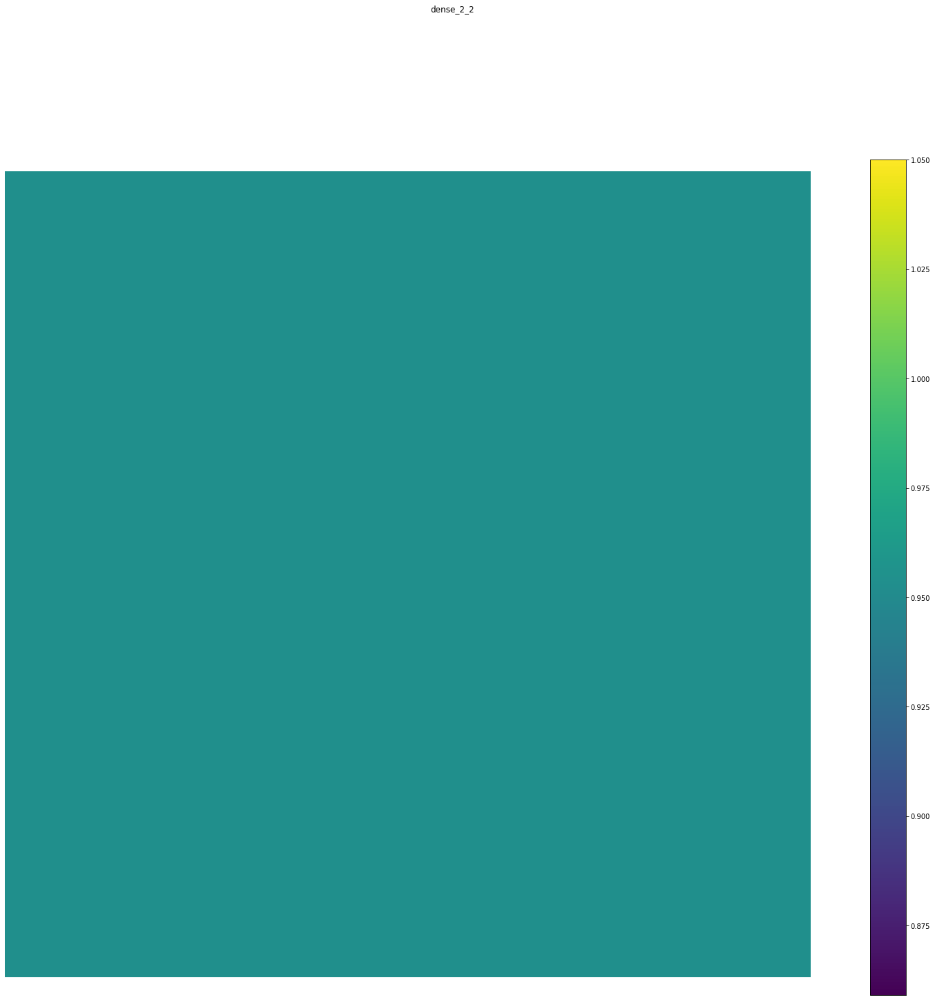

In [0]:
from keract import display_activations
display_activations(activations, save=False)

# Heat map after various layers

conv2d_1_input_2 (1, 224, 224, 3) 


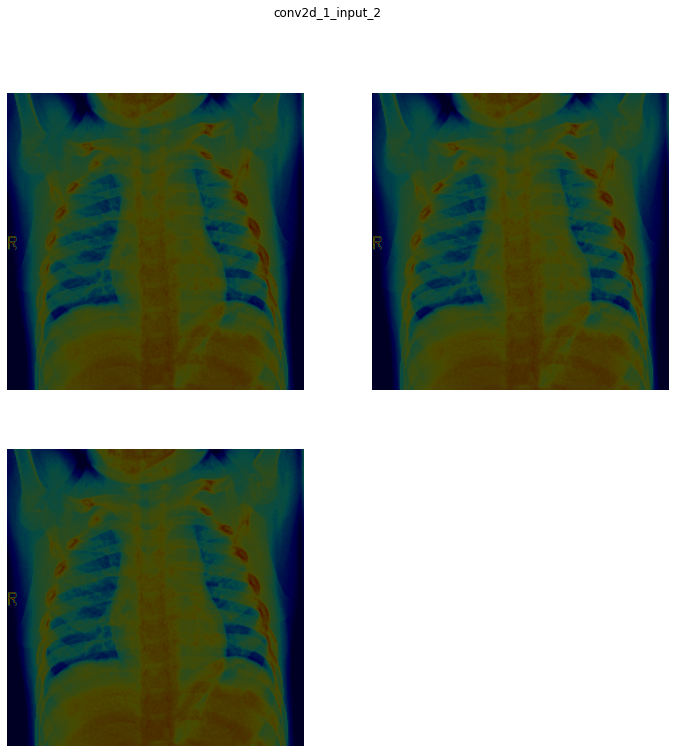

conv2d_1_2 (1, 222, 222, 32) 


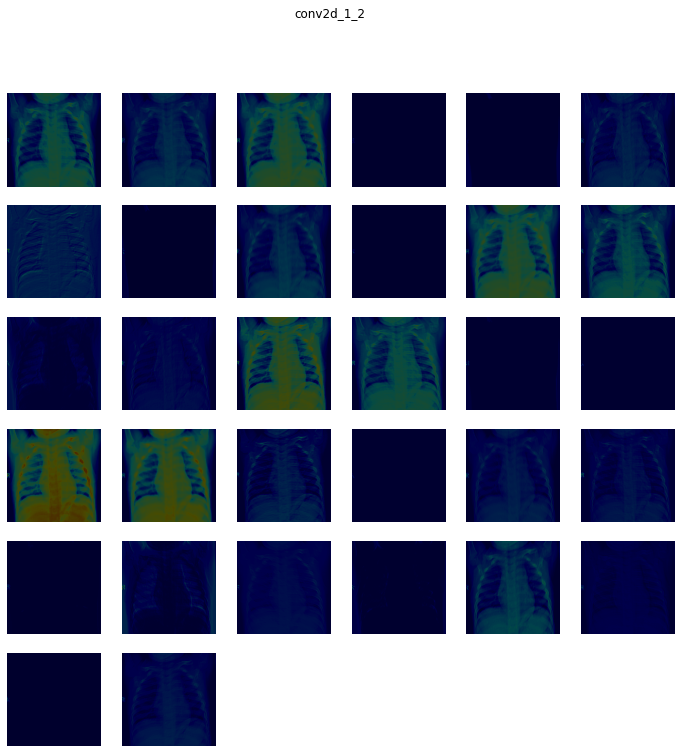

conv2d_2_2 (1, 220, 220, 64) 


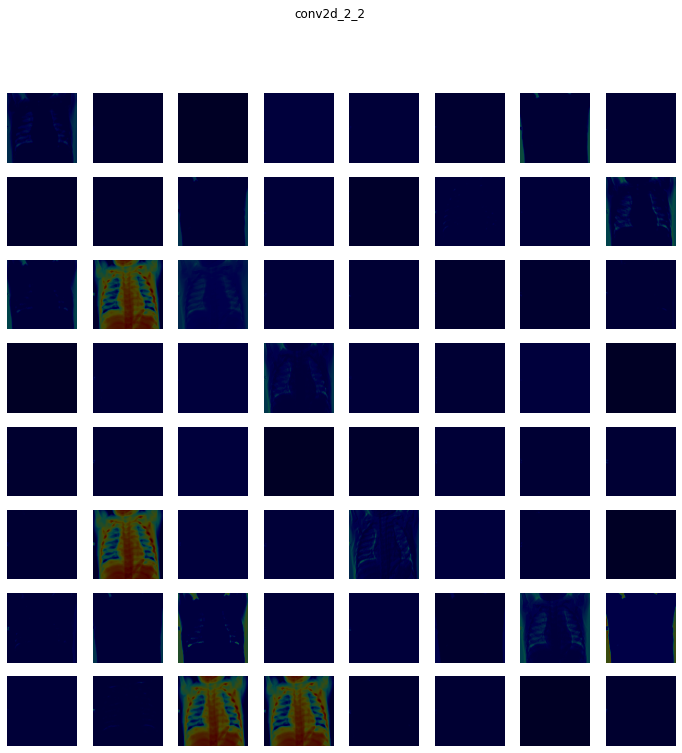

max_pooling2d_1_2 (1, 110, 110, 64) 


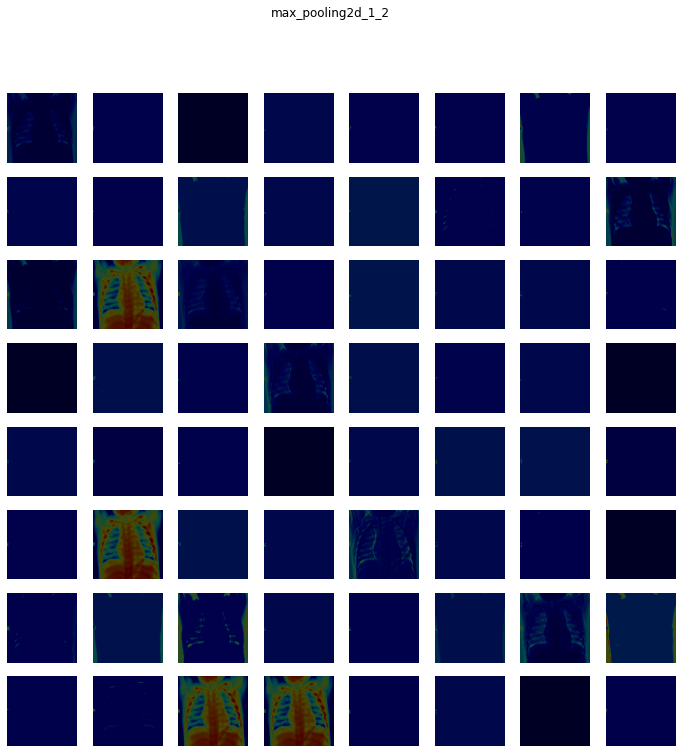

dropout_1_2 (1, 110, 110, 64) 


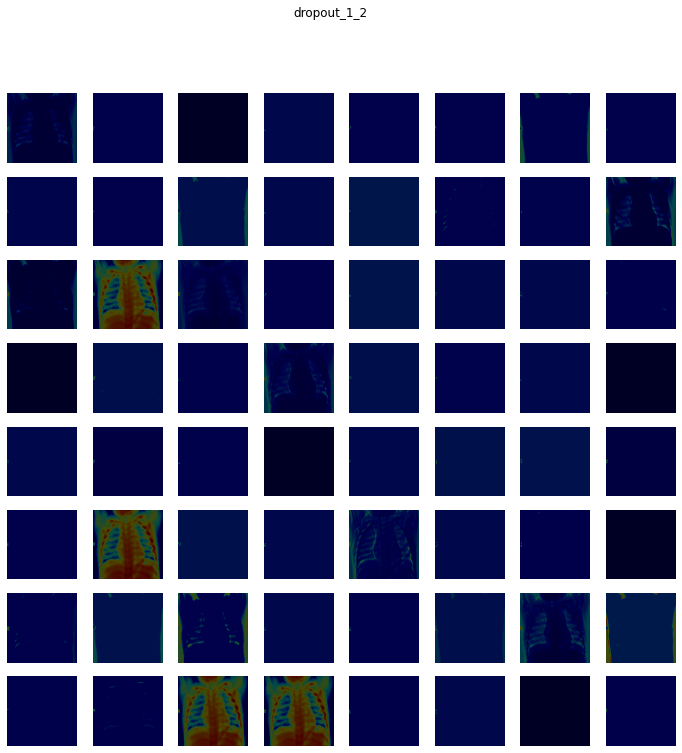

conv2d_3_2 (1, 108, 108, 64) 


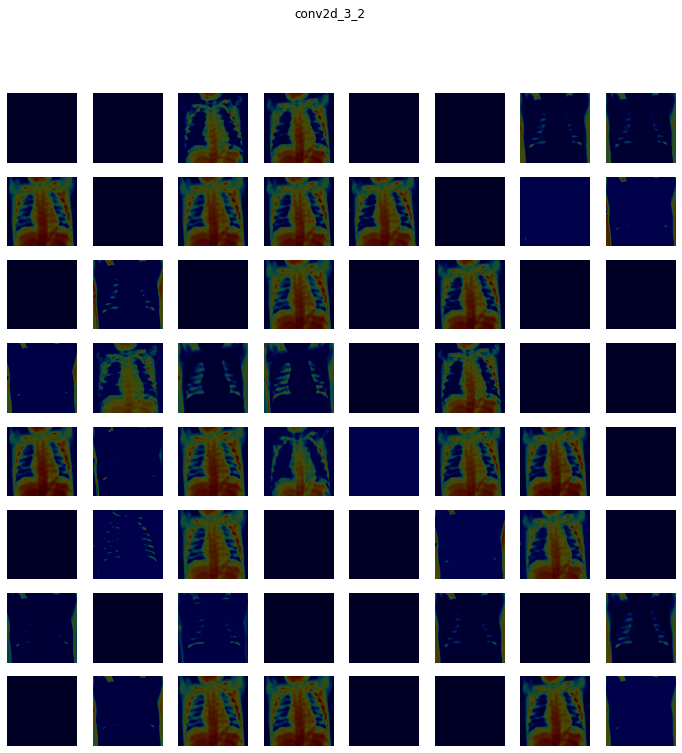

max_pooling2d_2_2 (1, 54, 54, 64) 


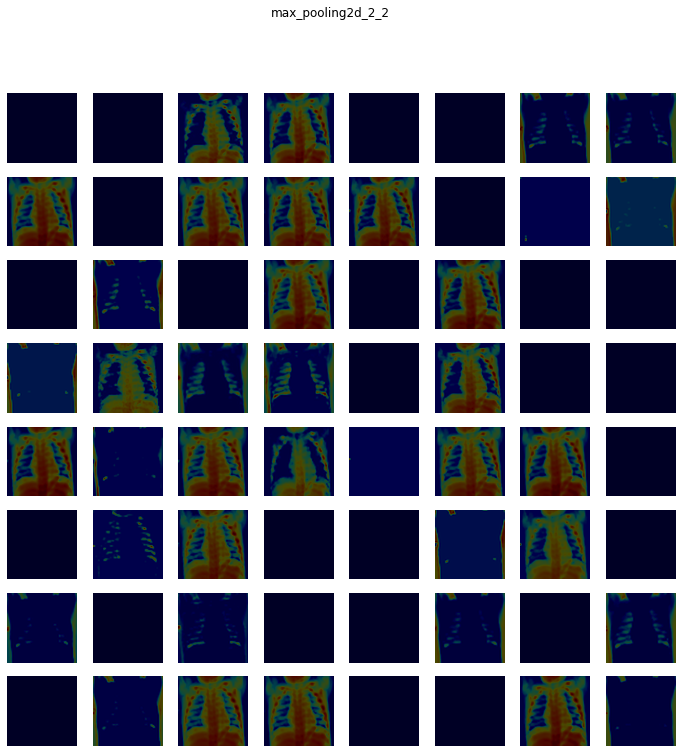

dropout_2_2 (1, 54, 54, 64) 


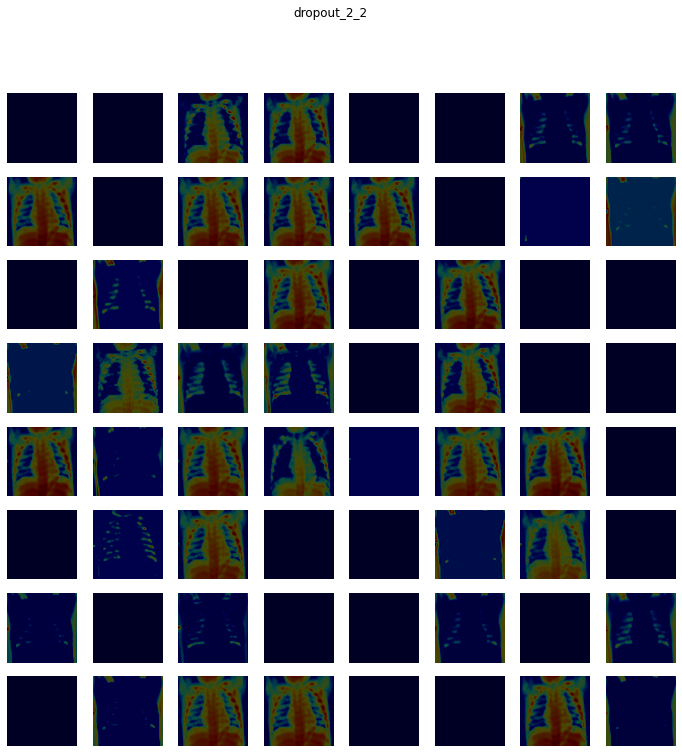

conv2d_4_2 (1, 52, 52, 128) 


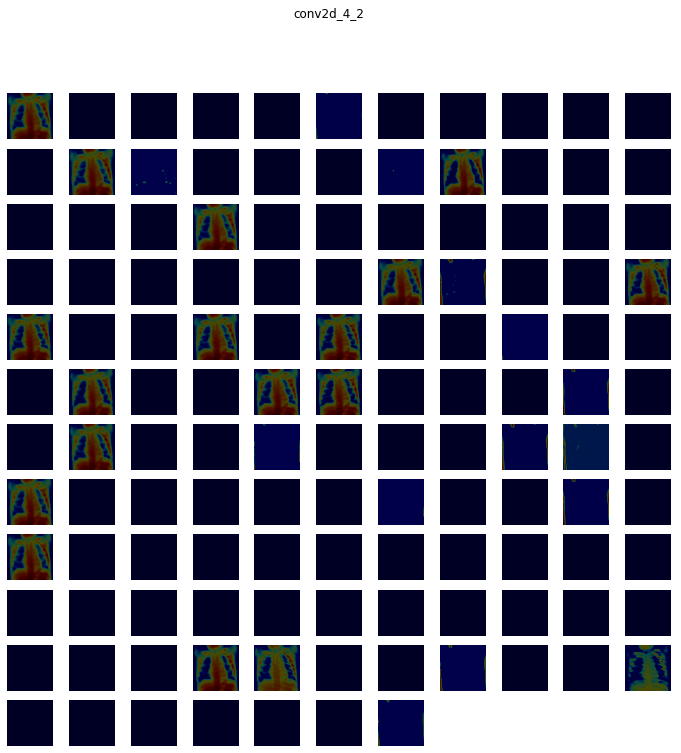

max_pooling2d_3_2 (1, 26, 26, 128) 


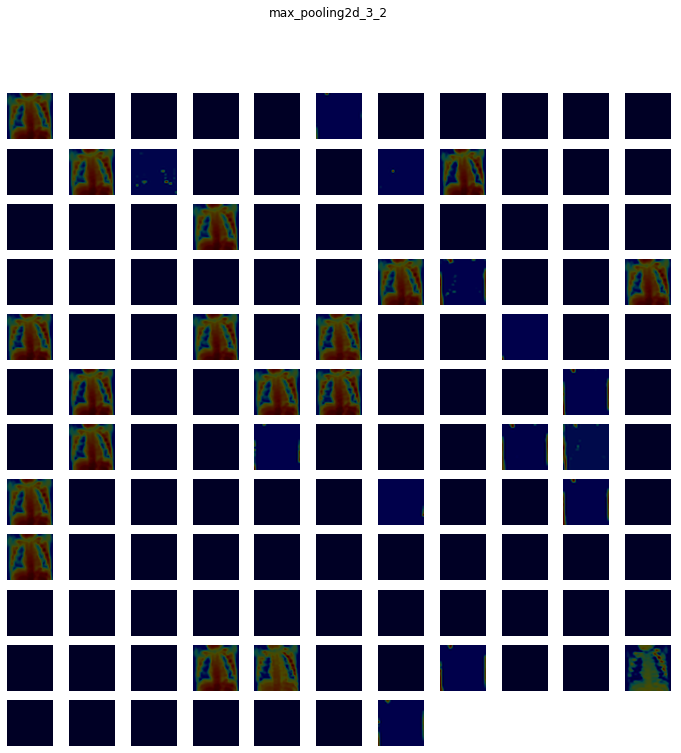

dropout_3_2 (1, 26, 26, 128) 


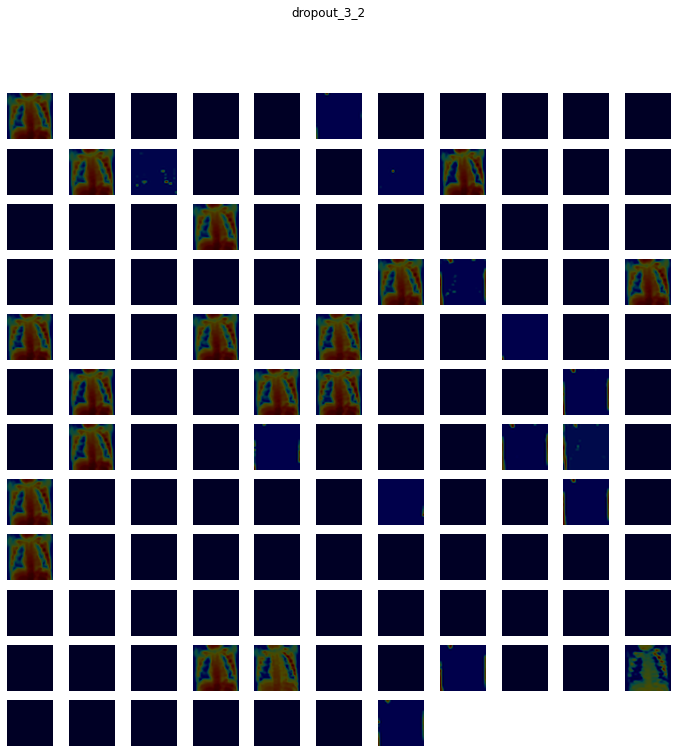

flatten_1_2 (1, 86528) -> Skipped. 2D Activations.
dense_1_2 (1, 64) -> Skipped. 2D Activations.
dropout_4_2 (1, 64) -> Skipped. 2D Activations.
dense_2_2 (1, 1) -> Skipped. 2D Activations.


In [0]:
from keract import display_heatmaps
display_heatmaps(activations, x, save=False)